In [10]:
import icon_registration as icon
import torch
import torchvision
import numpy as np
from icon_registration import networks
import icon_registration as icon
import icon_registration.data
import icon_registration.networks as networks
from icon_registration.config import device

import numpy as np
import torch
import torchvision.utils
import matplotlib.pyplot as plt
import torch.nn.functional as F

import multiscale_constr_model as constr

class ICONSquaringVelocityField(icon.RegistrationModule):
    def __init__(self, net):
        super().__init__()
        self.net = net
        self.n_steps = 7

    def forward(self, image_A, image_B):
        velocity_field = self.net(image_A, image_B) - self.net(image_B, image_A)
        velocityfield_delta_a = velocity_field / 2**self.n_steps
        velocityfield_delta = velocityfield_delta_a

        for _ in range(self.n_steps):
            velocityfield_delta = velocityfield_delta + self.as_function(
                velocityfield_delta
            )(velocityfield_delta + self.identity_map)

        field = self.as_function(velocityfield_delta)

        def transform_AB(coordinate_tensor):
            coords = coordinate_tensor
            coords_reflected = coords - 2 * coords * (coords < 0) - 2 * (coords - 1) * (coords > 1)
            coordinate_tensor = coordinate_tensor + 2 * field(coords) - field(coords_reflected)
            return coordinate_tensor

        transform_AB.velocity_field = velocity_field


        return transform_AB

In [2]:
class RandomMatrix(icon.RegistrationModule):
    def __init__(self, scale):
        super().__init__()
        self.scale = scale
    def forward(self, a, b):
        if len(a.shape) == 4:
            noise = torch.randn(a.shape[0], 2, 2) * self.scale
            noise = noise - noise.permute([0, 2, 1])
            noise = torch.linalg.matrix_exp(noise)
            noise = torch.cat([noise, torch.zeros(a.shape[0], 2, 1)], axis=2).to(a.device)
            x = noise
            x = torch.cat(
                [
                    x,
                    torch.Tensor([[[0, 0, 1]]]).to(x.device).expand(x.shape[0], -1, -1),
                ],
                1,
            )
            x = torch.matmul(
                torch.Tensor([[1, 0, 0.5], [0, 1, 0.5], [0, 0, 1]]).to(x.device), x
            )
            x = torch.matmul(
                x,
                torch.Tensor([[1, 0, -0.5], [0, 1, -0.5], [0, 0, 1]]).to(x.device),
            )
            return x
        elif len(a.shape) == 5:
            noise = torch.randn(a.shape[0], 3, 3) * 13
            noise = noise - noise.permute([0, 2, 1])
            noise = torch.linalg.matrix_exp(noise)
            noise = torch.cat([noise, torch.zeros(a.shape[0], 3, 1)], axis=2).to(a.device)
            x = noise
            x = torch.cat(
                [
                    x,
                    torch.Tensor([[[0, 0, 0, 1]]]).to(x.device).expand(x.shape[0], -1, -1),
                ],
                1,
            )
            x = torch.matmul(
                torch.Tensor([[1, 0, 0, 0.5], [0, 1, 0, 0.5], [0, 0, 1, 0.5], [0, 0, 0, 1]]).to(x.device), x
            )
            x = torch.matmul(
                x,
                torch.Tensor([[1, 0, 0, -0.5], [0, 1, 0, -0.5], [0, 0, 1, -0.5], [0, 0, 0, 1]]).to(x.device),
            )
            return x


class RotationFunctionFromVectorField(icon.RegistrationModule):

    def __init__(self, net):
        super().__init__()
        self.net = net
    def forward(self, a, b):
        displacements = self.net(a, b)
        field = self.as_function(displacements)

        def transform(coords):
            coords_reflected = coords - 2 * coords * (coords < 0) - 2 * (coords - 1) * (coords > 1)
            if hasattr(coords, "isIdentity") and coords.shape == displacements.shape:
                return coords + displacemnts
            return coords + 2 * field(coords) - field(coords_reflected)
        return transform

class FunctionsFromMatrix(icon.RegistrationModule):
    """
    wrap an inner neural network `net` that returns an N x N+1 matrix representing
    an affine transform, into a RegistrationModule that returns a function that
    transforms a tensor of coordinates.
    """

    def __init__(self, net):
        super().__init__()
        self.net = net

    def forward(self, image_A, image_B):
        matrix_phi = self.net(image_A, image_B).detach().clone()
        matrix_phi = np.array(matrix_phi.cpu().detach())
        matrix_phi = torch.tensor(matrix_phi).to(image_A.device)

        def transform(tensor_of_coordinates):
            shape = list(tensor_of_coordinates.shape)
            shape[1] = 1
            coordinates_homogeneous = torch.cat(
                [tensor_of_coordinates, torch.ones(shape, device=tensor_of_coordinates.device)], axis=1
            )
            return icon.network_wrappers.multiply_matrix_vectorfield(matrix_phi, coordinates_homogeneous)[:, :-1]

        inv = torch.linalg.inv(matrix_phi.detach().clone())

        def invtransform(tensor_of_coordinates):
            shape = list(tensor_of_coordinates.shape)
            shape[1] = 1
            coordinates_homogeneous = torch.cat(
                [tensor_of_coordinates, torch.ones(shape, device=tensor_of_coordinates.device)], axis=1
            )
            return icon.network_wrappers.multiply_matrix_vectorfield(inv, 
                    coordinates_homogeneous)[:, :-1]

        return transform, invtransform

class DoubleStep(icon.RegistrationModule):

    def __init__(self, netPhi, netPsi):
        super().__init__()
        self.netPhi = netPhi
        self.netPsi = netPsi

    def forward(self, image_A, image_B):
        
        # Tag for shortcutting hack. Must be set at the beginning of 
        # forward because it is not preserved by .to(config.device)
        self.identity_map.isIdentity = True
            
        phi, invphi = self.netPhi(image_A, image_B)
        psi = self.netPsi(
            self.as_function(image_A)(invphi(self.identity_map)),
            self.as_function(image_B)(invphi(self.identity_map)),
        )
        return lambda tensor_of_coordinates: invphi(psi(phi(tensor_of_coordinates)))



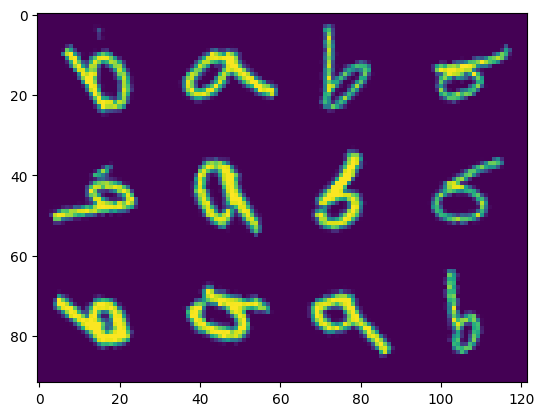

In [26]:
def augment(image_A):

    noise = torch.randn((image_A.shape[0], 2, 2))

    noise = noise - torch.permute(noise, (0, 2, 1))

    forward = torch.linalg.matrix_exp(noise / .002)

    full = torch.zeros((image_A.shape[0], 2, 3))

    full[:, :2, :2] = forward

    grid_shape = list(image_A.shape)
    grid_shape[1] = 2
    forward_grid = F.affine_grid(full, grid_shape)

    warped_A = F.grid_sample(image_A, forward_grid, padding_mode="border")

    return warped_A
def show(tensor):
        plt.imshow(torchvision.utils.make_grid(tensor[:16], nrow=4)[0].cpu().detach())
        plt.xticks([])
        plt.yticks([])

def get_dataset_mnist(split, number=9):
    ds = torch.utils.data.DataLoader(
        torchvision.datasets.MNIST(
            "./files/",
            transform=torchvision.transforms.ToTensor(),
            download=True,
            train=(split == "train"),
        ),
        batch_size=500,
    )
    images = []
    for _, batch in enumerate(ds):
        label = np.array(batch[1])
        batch_nines = label == number
        batch = augment(torch.tensor(np.array(batch[0])[batch_nines]))
        
        images.append(batch)
    images = torch.cat(images)

    ds = torch.utils.data.TensorDataset(torch.Tensor(images))
    d1, d2 = (
        torch.utils.data.DataLoader(
            ds,
            batch_size=128,
            shuffle=True,
        )
        for _ in (1, 1)
    )
    return d1, d2


def show(tensor):
    plt.imshow(torchvision.utils.make_grid(tensor[:16], nrow=4)[0].cpu().detach())
    plt.xticks([])
    plt.yticks([])
    
def performance(net, eopchs):
    if eopchs:
      net.assign_identity_map(sample_batch.shape)
      net.train()
      net.to(device)

      optim = torch.optim.Adam(net.parameters(), lr=0.001)
      curves = icon.train_datasets(net, optim, ds, ds, epochs=eopchs)
    
      plt.plot(np.array(curves)[:, :3])
      plt.show()
    
    
    image_A = next(iter(ds))[0].to(device)
    image_B = next(iter(ds))[0].to(device)
    with torch.no_grad():
        net(image_A, image_B)
    plt.subplot(2, 2, 1)
    show(image_A)
    plt.subplot(2, 2, 2)
    show(image_B)
    plt.subplot(2, 2, 3)
    show(net.warped_image_A)
    plt.contour(torchvision.utils.make_grid(net.phi_AB_vectorfield[:16], nrow=4)[0].cpu().detach())
    plt.contour(torchvision.utils.make_grid(net.phi_AB_vectorfield[:16], nrow=4)[1].cpu().detach())
    plt.subplot(2, 2, 4)
    show(net.warped_image_A - image_B)
    plt.tight_layout()
    plt.show()
    return curves[-1][2]


#d1, d2 = get_dataset_mnist("train", number=9)
#d1, d2 = icon.data.get_dataset_triangles(hollow=True, data_size=64)
#ds = d1

import matplotlib.pyplot as plt
sample_batch = next(iter(ds))[0]
plt.imshow(torchvision.utils.make_grid(sample_batch[:12], nrow=4)[0])

In [27]:
def show(tensor):
    plt.imshow(torchvision.utils.make_grid(tensor[:16], nrow=4)[0].cpu().detach())
    plt.xticks([])
    plt.yticks([])

In [28]:
#net.identity_map

def even_pad(img, amt):
    return F.pad(img, (amt,) * 4, "replicate") * 2 - F.pad(img, (amt,) * 4, "reflect")
from icon_registration.losses import _get_gaussian_kernel1d

def even_blur(tensor, sigma):

    kernel_size = 3 * sigma
    kernel_size += 1 - kernel_size%2
    
    kernel1d = _get_gaussian_kernel1d(kernel_size=kernel_size, sigma=sigma).to(
        tensor.device, dtype=tensor.dtype
    )
    out = tensor
    group = tensor.shape[1]

    out = even_pad(out, kernel_size // 2)

    if len(tensor.shape) - 2 == 1:
        out = torch.conv1d(out, kernel1d[None, None, :].expand(group,-1,-1), groups=group)
    elif len(tensor.shape) - 2 == 2:
        out = torch.conv2d(out, kernel1d[None, None, :, None].expand(group,-1,-1,-1), groups=group)
        out = torch.conv2d(out, kernel1d[None, None, None, :].expand(group,-1,-1,-1), groups=group)
    elif len(tensor.shape) - 2 == 3:
        out = torch.conv3d(out, kernel1d[None, None, :, None, None].expand(group,-1,-1,-1,-1), groups=group)
        out = torch.conv3d(out, kernel1d[None, None, None, :, None].expand(group,-1,-1,-1,-1), groups=group)
        out = torch.conv3d(out, kernel1d[None, None, None, None, :].expand(group,-1,-1,-1,-1), groups=group)


    return out


    
    
#plt.imshow(even_blur(net.identity_map, 3)[0, 0].cpu())

In [29]:
(4,) * 3

(4, 4, 4)

In [30]:

class Blur(icon.network_wrappers.RegistrationModule):
    def __init__(self, net, radius):
        super().__init__()
        self.radius = radius
        self.net = net
    def forward(self, A, B):
        phi = self.net(A, B)(self.identity_map)
        phi = even_blur(phi, self.radius)
        field = self.as_function(phi - self.identity_map)

        def transform(coords):
            coords_reflected = coords - 2 * coords * (coords < 0) - 2 * (coords - 1) * (coords > 1)
            if hasattr(coords, "isIdentity") and coords.shape == phi.shape:
                return coords + displacemnts
            return coords + 2 * field(coords) - field(coords_reflected)
        return transform

In [31]:
class HarmonicRegularizedNet(icon.losses.BendingEnergyNet):
    def compute_bending_energy_loss(self, phi_AB_vectorfield):
        
        if len(self.identity_map.shape) == 3:
            bending_energy = torch.mean((
                - phi_AB_vectorfield[:, :, 1:]
                + phi_AB_vectorfield[:, :, 1:-1]
            )**2)

        elif len(self.identity_map.shape) == 4:
            bending_energy = torch.mean((
                - phi_AB_vectorfield[:, :, 1:]
                + phi_AB_vectorfield[:, :, :-1]
            )**2) + torch.mean((
                - phi_AB_vectorfield[:, :, :, 1:]
                + phi_AB_vectorfield[:, :, :, :-1]
            )**2)
        elif len(self.identity_map.shape) == 5:
            bending_energy = torch.mean((
                - phi_AB_vectorfield[:, :, 1:]
                + phi_AB_vectorfield[:, :, :-1]
            )**2) + torch.mean((
                - phi_AB_vectorfield[:, :, :, 1:]
                + phi_AB_vectorfield[:, :, :, :-1]
            )**2) + torch.mean((
                - phi_AB_vectorfield[:, :, :, :, 1:]
                + phi_AB_vectorfield[:, :, :, :, :-1]
            )**2)


        return bending_energy * self.identity_map.shape[2] **2

100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


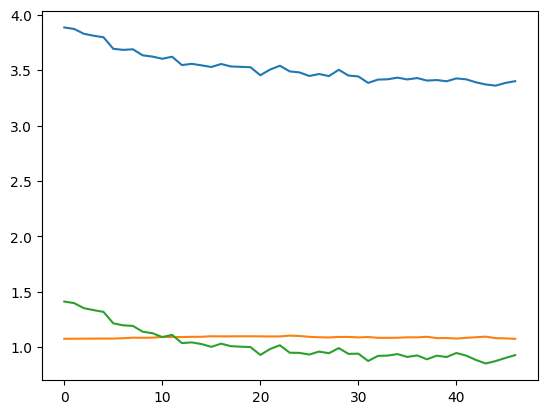

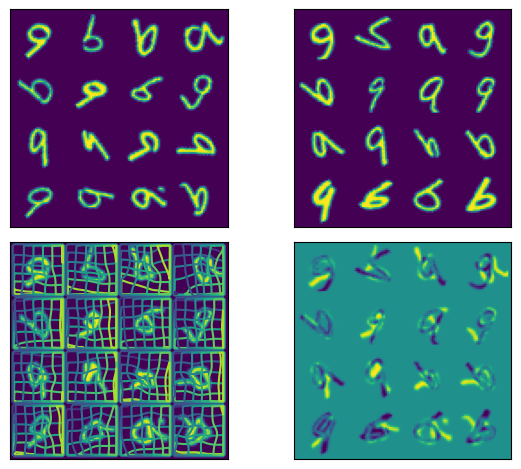

0.9279466867446899

In [34]:
#regnet = networks.FCNet()
#torch.nn.init.zeros_(regnet.dense3.weight)
regnet = networks.tallUNet2(dimension=2)
inner_net = ICONSquaringVelocityField(regnet)

#for i in range(6):
     #regnet = networks.tallUNet2(dimension=2)

#     inner_net = icon.TwoStepRegistration(
#         Blur(inner_net, [15, 12, 9, 6, 6, 6][i]),
#         DoubleStep(FunctionsFromMatrix(RandomMatrix(10)), ICONSquaringVelocityField(regnet))
#     )

net = HarmonicRegularizedNet(inner_net, icon.LNCC(sigma=4), lmbda=2.3)

#print(net)

performance(net, 1)

100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [02:33<00:00, 17.06s/it]


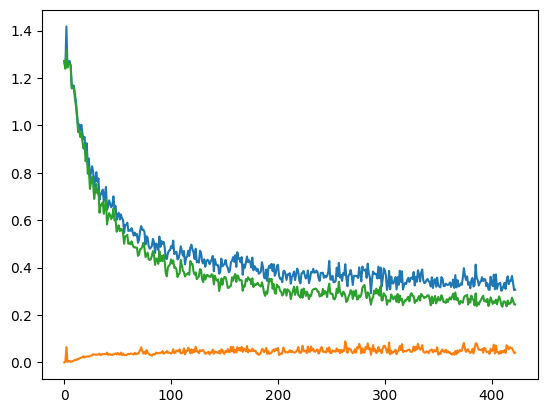

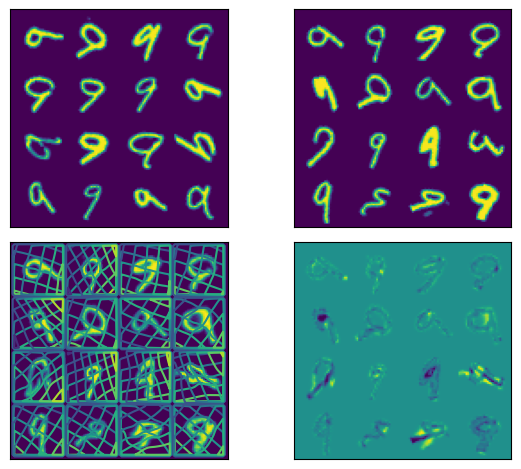

0.24453049898147583

In [228]:
#regnet = networks.FCNet()
#torch.nn.init.zeros_(regnet.dense3.weight)
regnet = networks.tallUNet2(dimension=2)
inner_net = RotationFunctionFromVectorField(regnet)

for i in range(6):
     #regnet = networks.tallUNet2(dimension=2)

     inner_net = icon.TwoStepRegistration(
         Blur(inner_net, [15, 12, 9, 6, 6, 6][i]),
         DoubleStep(FunctionsFromMatrix(RandomMatrix(13)), RotationFunctionFromVectorField(regnet))
     )

net = icon.losses.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=1.5)

#print(net)

performance(net, 9)

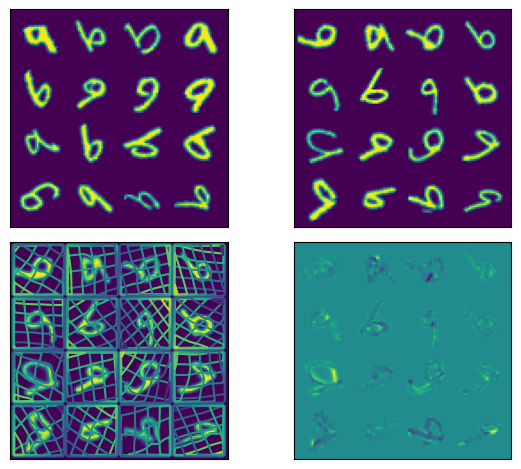

In [189]:
inner_net = RotationFunctionFromVectorField(regnet)

for i in range(12):
     #regnet = networks.tallUNet2(dimension=2)
     inner_net = icon.TwoStepRegistration(
         inner_net,
         icon.FunctionFromMatrix(RandomMatrix(.4 * (1/12) * (12 - i))),
     )

     inner_net = icon.TwoStepRegistration(
         Blur(inner_net, 15),
         DoubleStep(FunctionsFromMatrix(RandomMatrix(13)), RotationFunctionFromVectorField(regnet))
     )




for i in range(6):
     #regnet = networks.tallUNet2(dimension=2)

     inner_net = icon.TwoStepRegistration(
         Blur(inner_net, [15, 12, 9, 6, 6, 6][i]),
         DoubleStep(FunctionsFromMatrix(RandomMatrix(13)), RotationFunctionFromVectorField(regnet))
     )

net = icon.losses.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=1.5)

#print(net)

net = icon.losses.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=2)
net.assign_identity_map(sample_batch.shape)
net.cuda()
try:
    
   with torch.no_grad():
      performance(net, 0)
except:
    pass

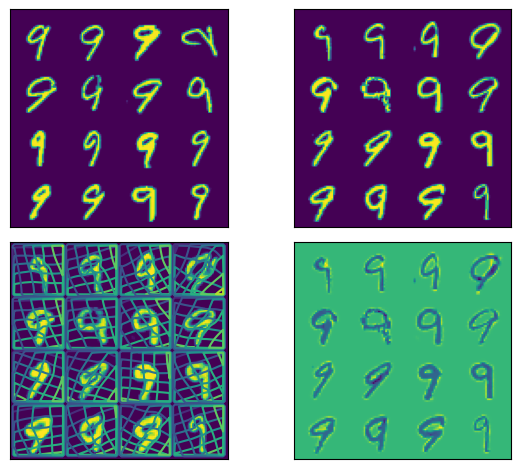

In [237]:

image_A = next(iter(ds))[0].to(device) 
image_B = next(iter(ds))[0].to(device)* 2
with torch.no_grad():
    net(image_A, image_B)
plt.subplot(2, 2, 1)
show(image_A)
plt.subplot(2, 2, 2)
show(image_B)
plt.subplot(2, 2, 3)
show(net.warped_image_A)
plt.contour(torchvision.utils.make_grid(net.phi_AB_vectorfield[:16], nrow=4)[0].cpu().detach())
plt.contour(torchvision.utils.make_grid(net.phi_AB_vectorfield[:16], nrow=4)[1].cpu().detach())
plt.subplot(2, 2, 4)
show(net.warped_image_A - image_B)
plt.tight_layout()
plt.show()

In [111]:
regnet = networks.tallUNet2(dimension=2)
inner_net = RotationFunctionFromVectorField(regnet)

for _ in range(12):
     #regnet = networks.tallUNet2(dimension=2)

     inner_net = icon.TwoStepRegistration(
         inner_net,
         RotationFunctionFromVectorField(regnet)
     )

net = icon.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=1.5)

performance(net, 6)

  0%|                                                                                                                                                                   | 0/6 [00:08<?, ?it/s]


KeyboardInterrupt: 

100%|█████████████████████████████████████████████████████████████████████████████████| 60/60 [14:29<00:00, 14.49s/it]


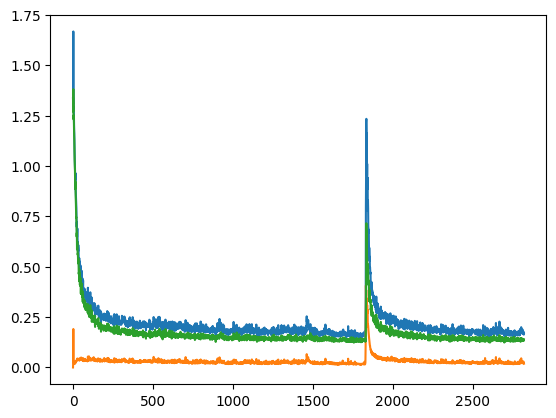

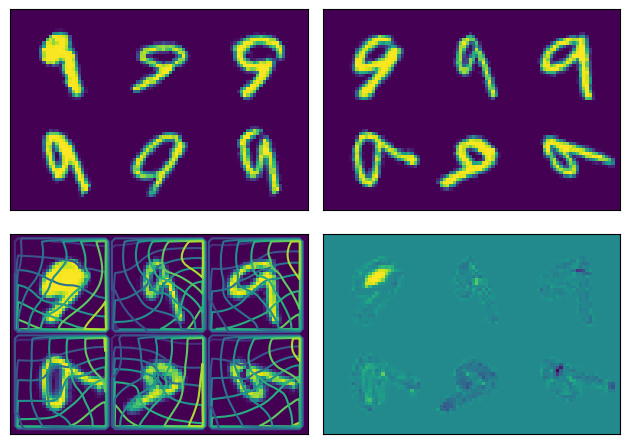

0.1393285095691681

In [72]:
regnet = networks.tallUNet2(dimension=2)
inner_net = icon.FunctionFromVectorField(regnet)

for _ in range(6):
     regnet = networks.tallUNet2(dimension=2)

     inner_net = icon.TwoStepRegistration(
         inner_net,
         icon.FunctionFromVectorField(regnet)
     )

net = icon.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=1.5)

performance(net, 60)

In [ ]:

regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

inner_net = regnet

for _ in range(3):
     inner_net = icon.TwoStepRegistration(
         inner_net,
         regnet
     )

inner_net = icon.TwoStepRegistration(
         inner_net,
         icon.FunctionFromVectorField(networks.tallUNet2(dimension=2))
     )

net = icon.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=1.5)

performance(net)



100%|███████████████████████████████████████████████████████████████████████████████| 125/125 [18:48<00:00,  9.03s/it]


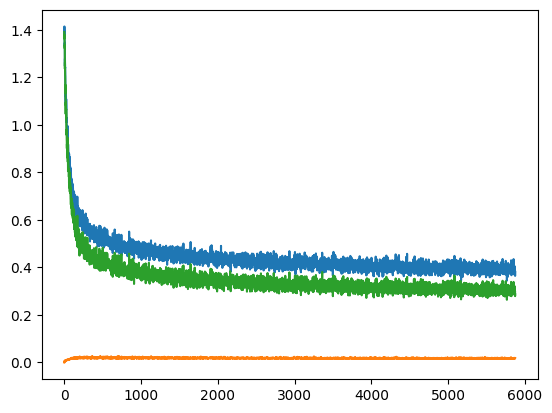

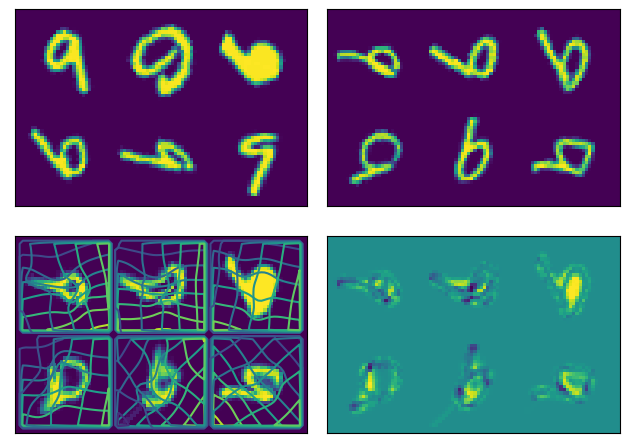

In [71]:

regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

inner_net = regnet

for _ in range(4):
     inner_net = icon.TwoStepRegistration(
         inner_net,
         regnet
     )
inner_net = icon.TwoStepRegistration(
         inner_net,
         icon.FunctionFromVectorField(networks.tallUNet2(dimension=2))
     )

net = icon.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=5)

performance(net, 125)

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:32<00:00,  6.52s/it]


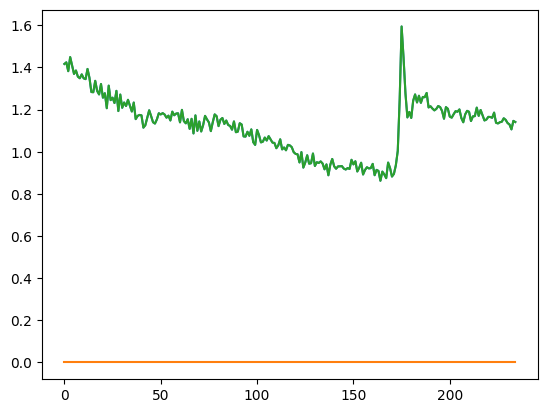

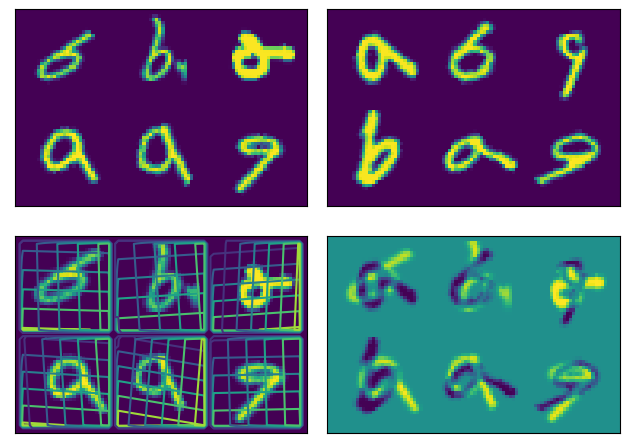

1.1408940553665161

In [83]:
regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

inner_net = regnet

for _ in range(8):
     inner_net = icon.TwoStepRegistration(
         inner_net,
         regnet
     )

net = icon.losses.BendingEnergyNet(inner_net, icon.LNCC(sigma=4), lmbda=.1)

performance(net, 5)

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:10<00:00,  2.17s/it]


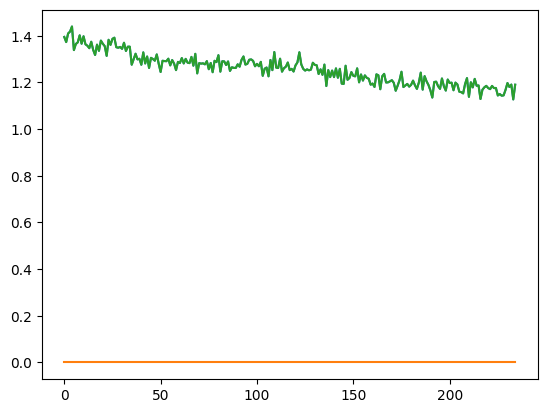

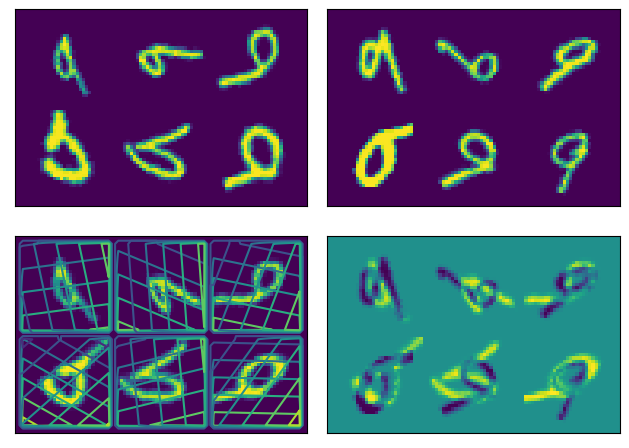

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:10<00:00,  2.13s/it]


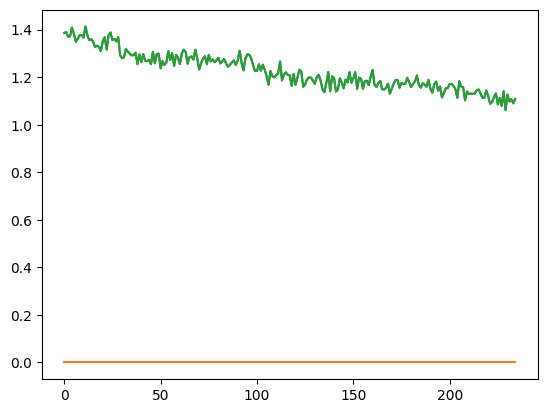

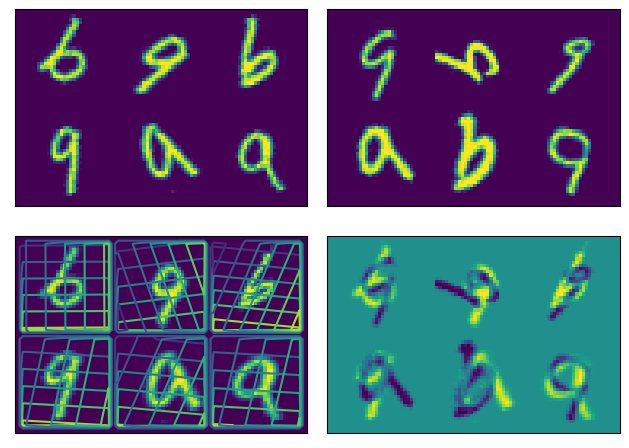

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:10<00:00,  2.18s/it]


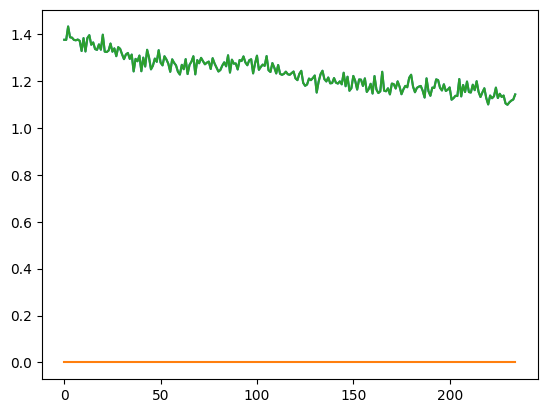

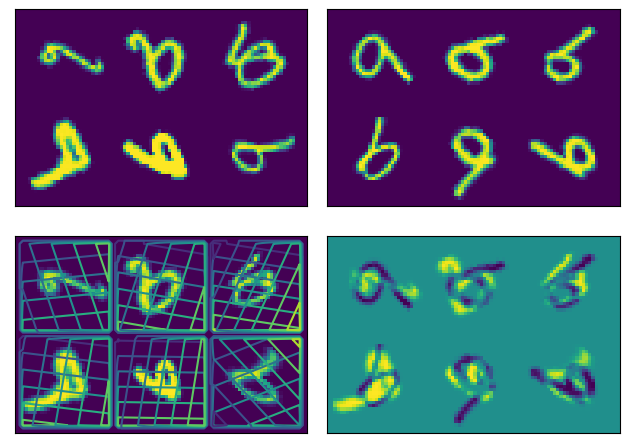

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:10<00:00,  2.13s/it]


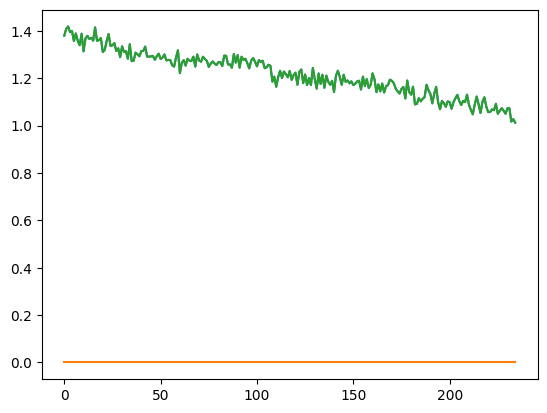

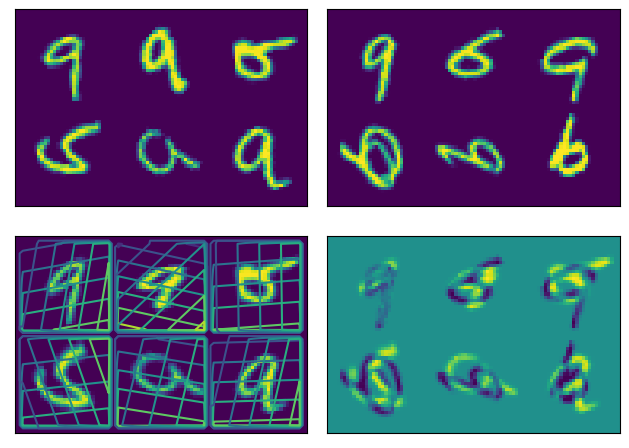

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:12<00:00,  2.54s/it]


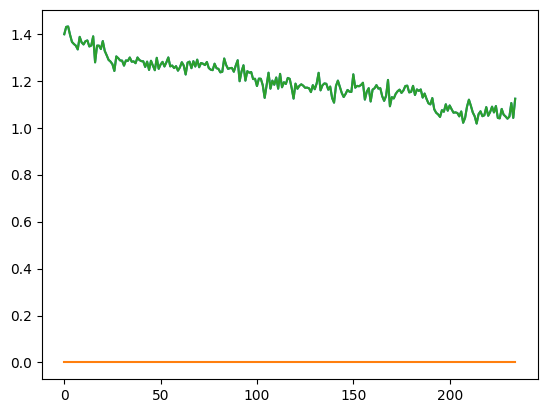

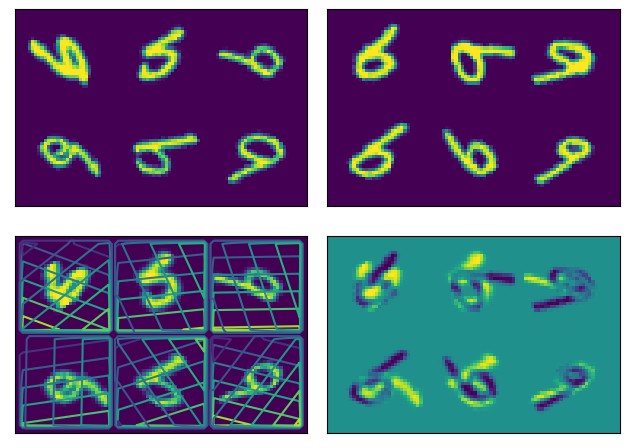

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.75s/it]


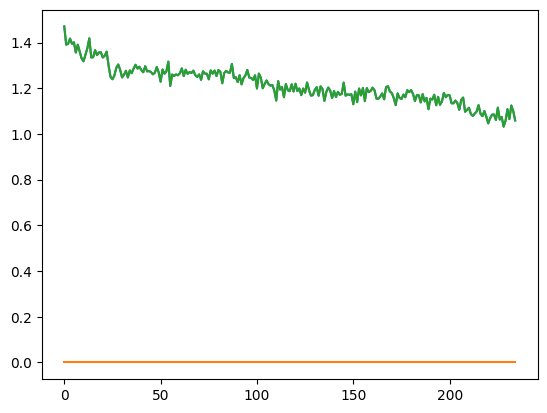

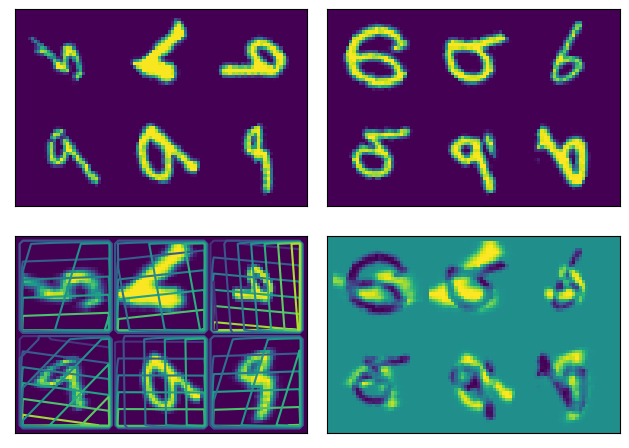

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


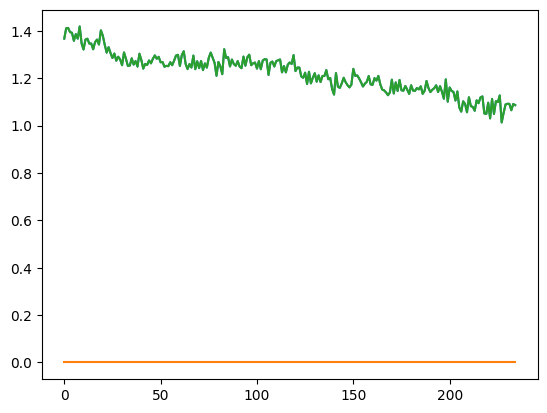

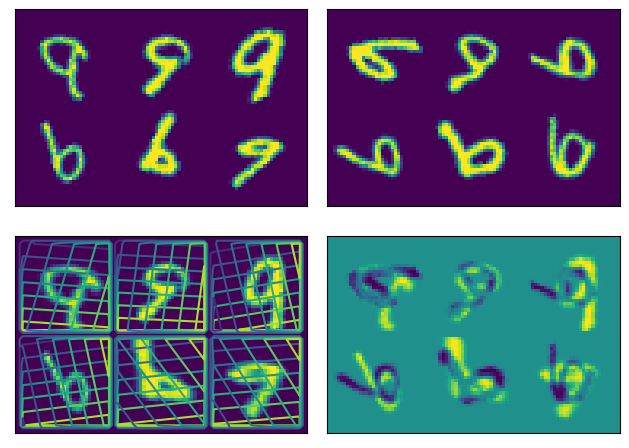

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.75s/it]


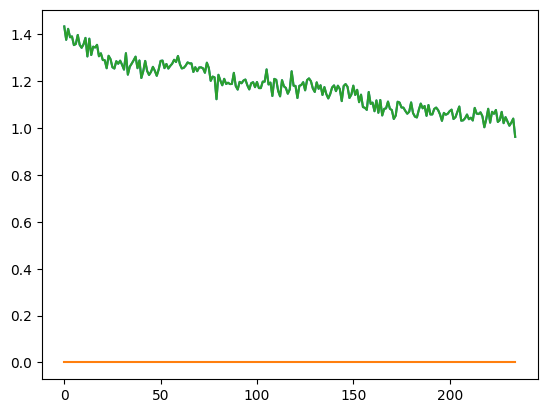

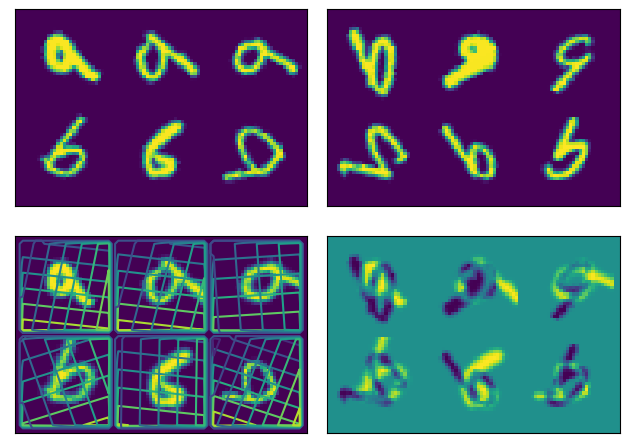

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.24s/it]


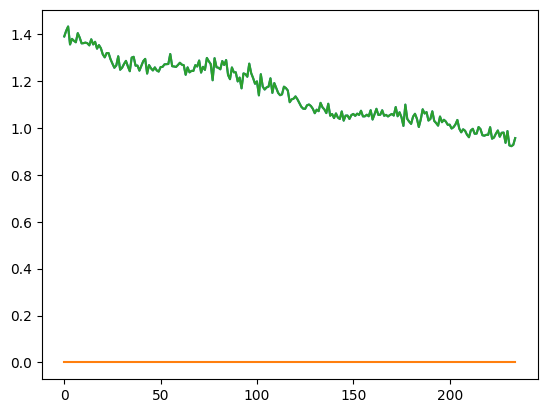

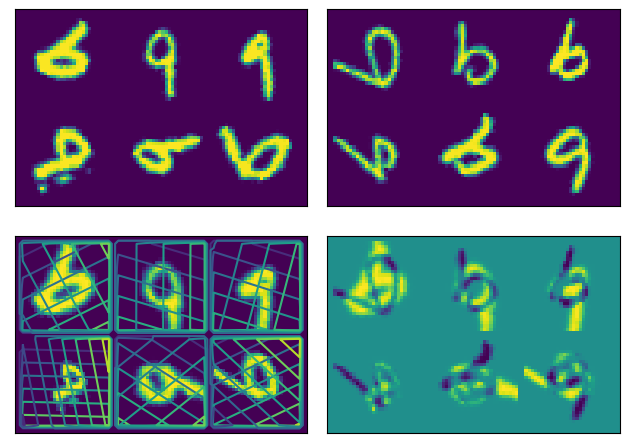

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.40s/it]


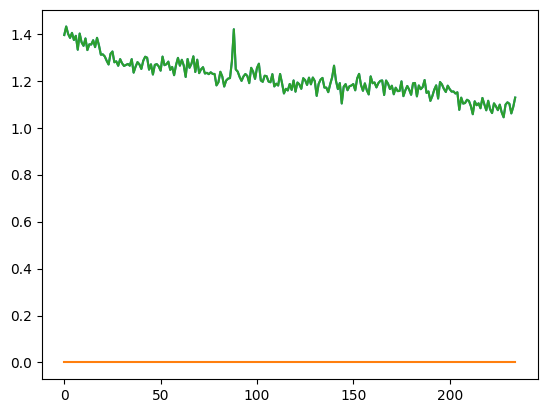

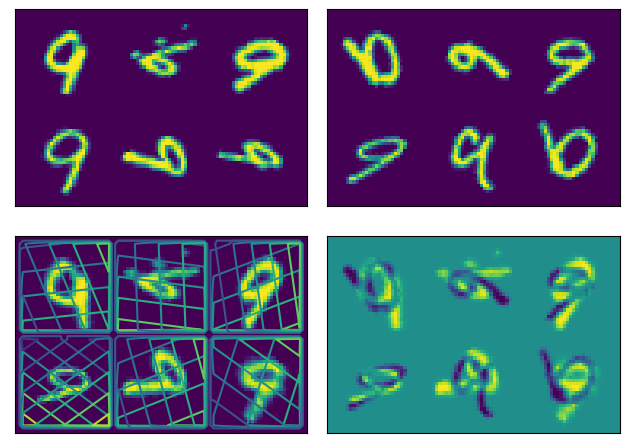

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.18s/it]


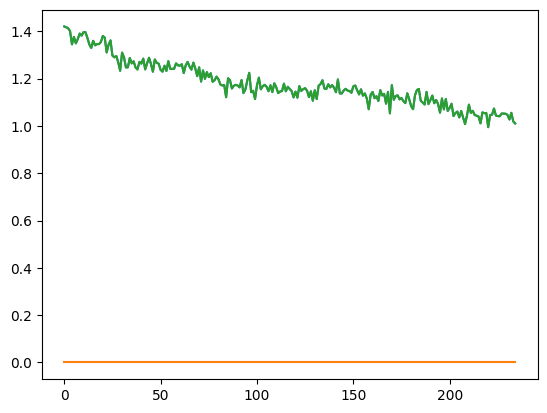

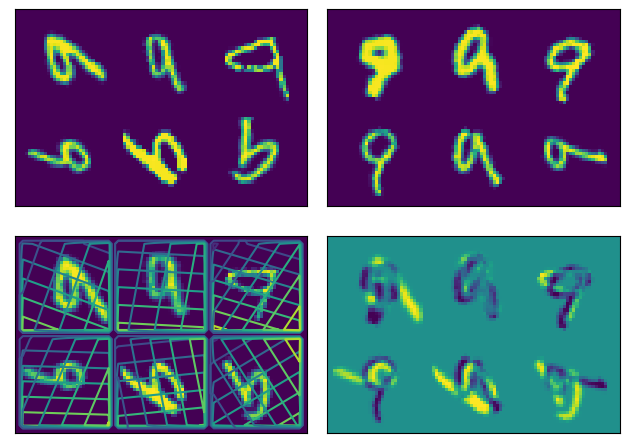

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.28s/it]


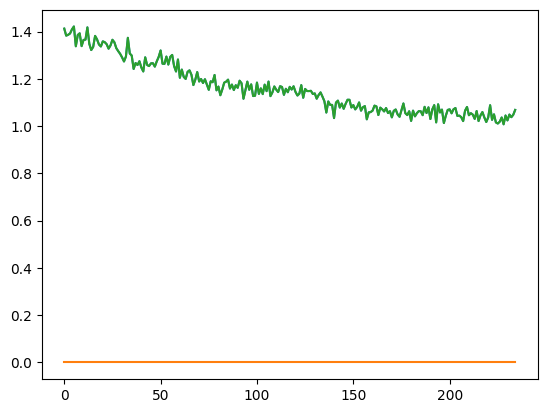

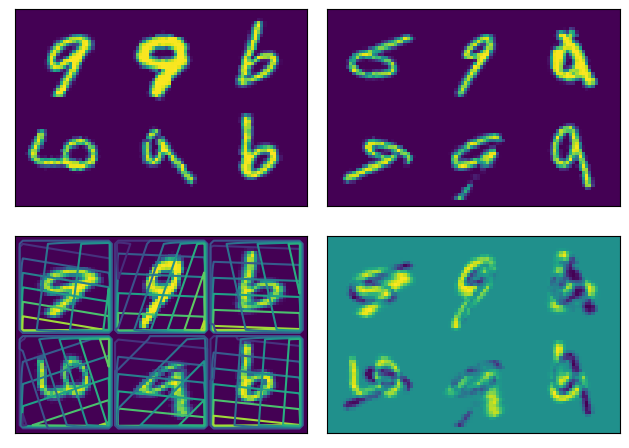

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:19<00:00,  3.93s/it]


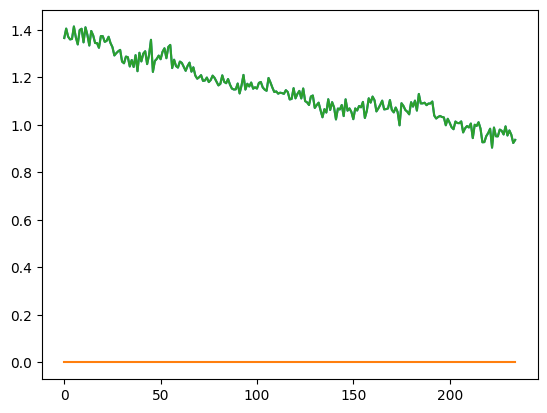

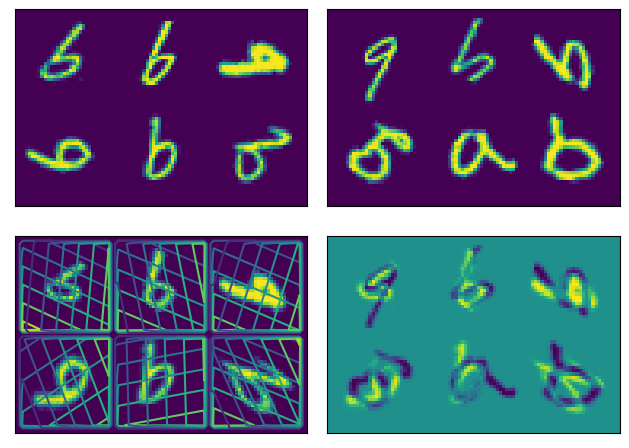

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:21<00:00,  4.25s/it]


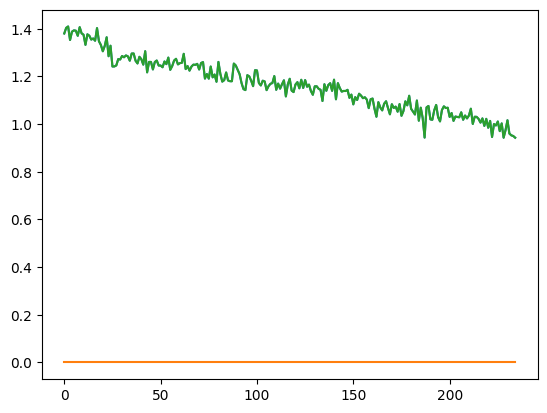

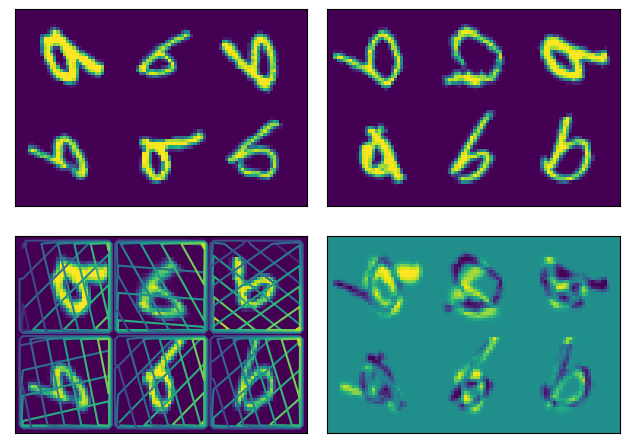

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.00s/it]


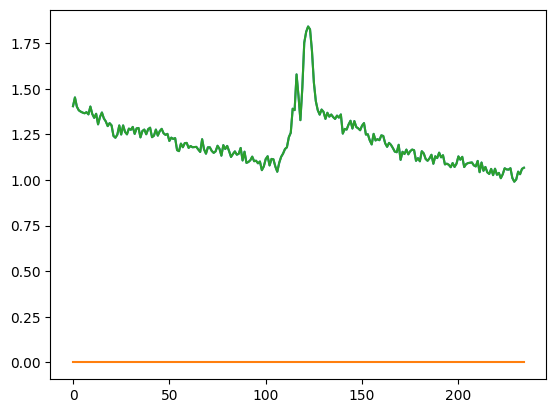

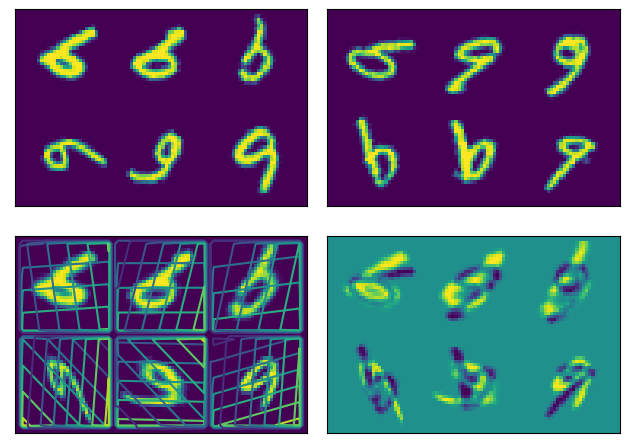

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:18<00:00,  3.72s/it]


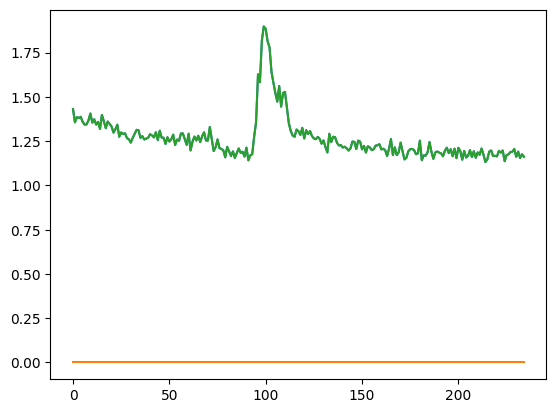

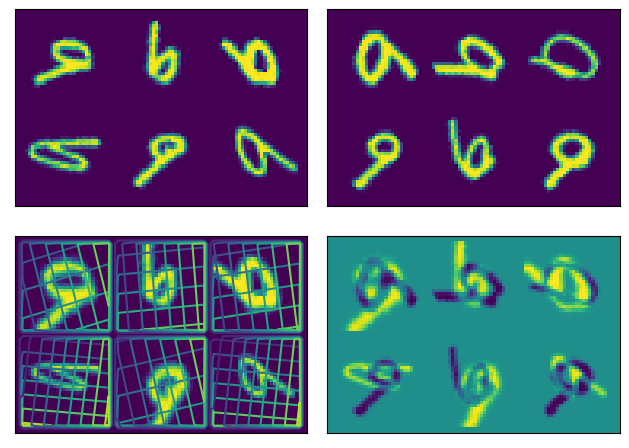

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.15s/it]


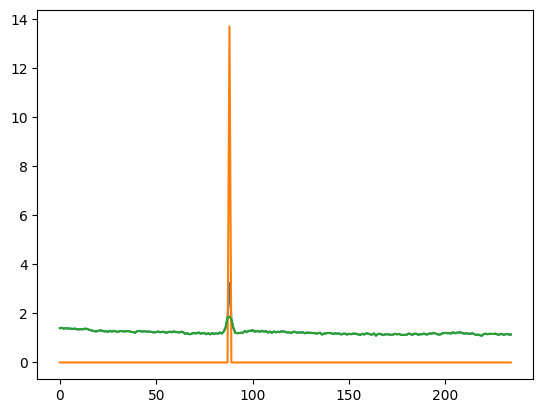

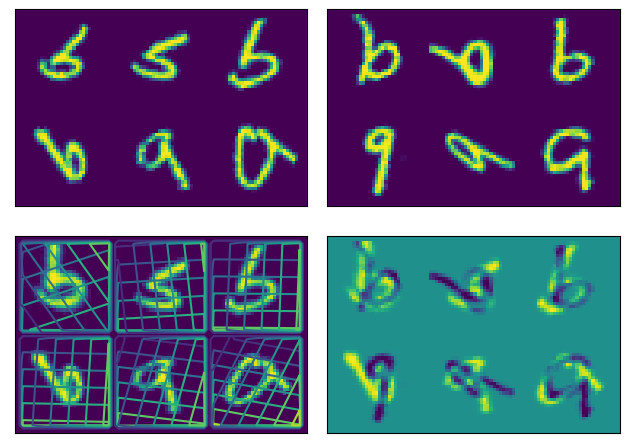

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.15s/it]


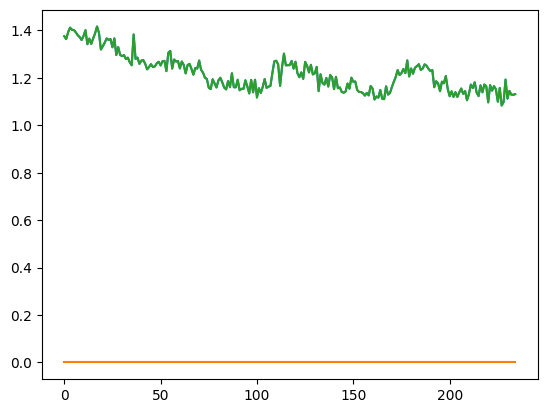

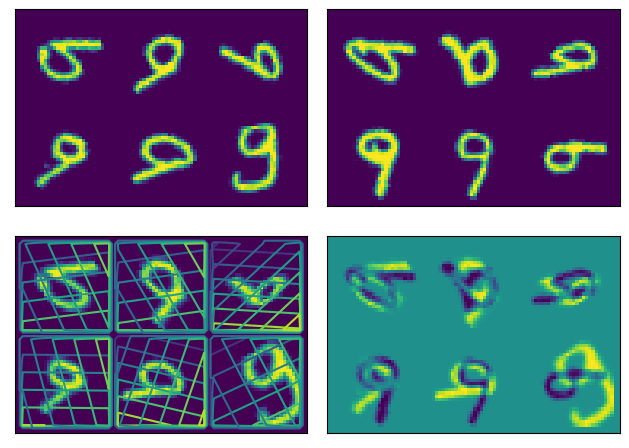

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.18s/it]


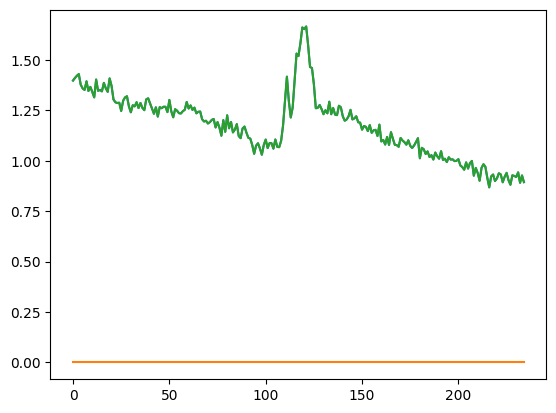

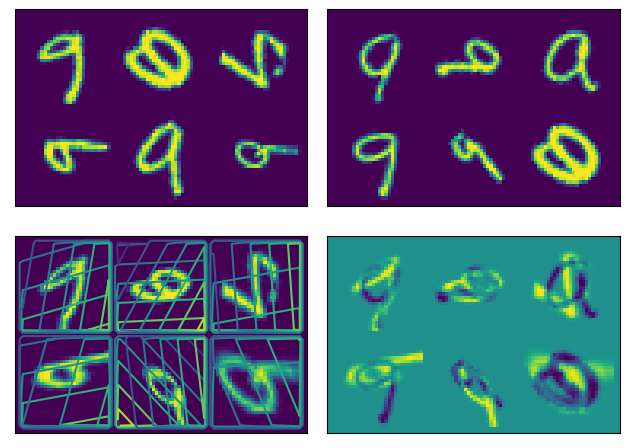

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:21<00:00,  4.25s/it]


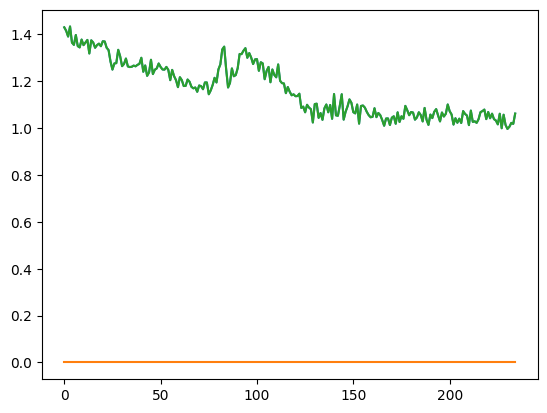

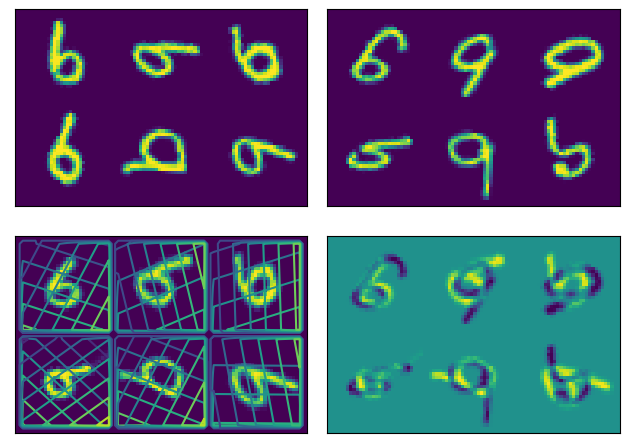

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:26<00:00,  5.22s/it]


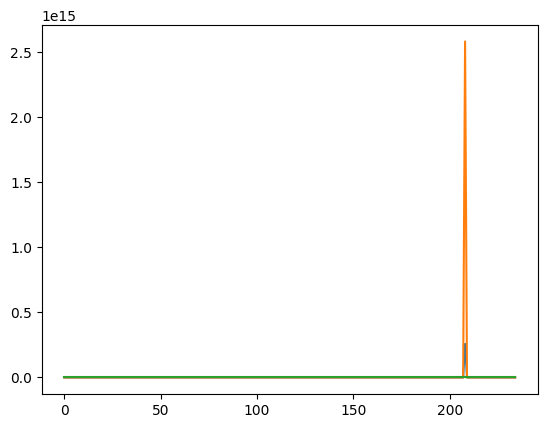

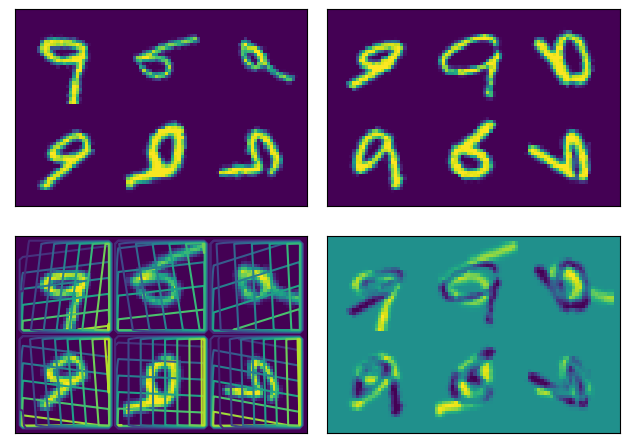

 80%|██████████████████████████████████████████████████████████████████▍                | 4/5 [00:16<00:04,  4.21s/it]


KeyboardInterrupt: 

In [85]:
steps_arr = []
goodness_arr = []

for n_steps in range(1, 16):
    for samples in range(4):
        regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

        inner_net = regnet

        for _ in range(n_steps):
             inner_net = icon.TwoStepRegistration(
                 inner_net,
                 regnet
             )

        net = icon.losses.BendingEnergyNet(inner_net, icon.LNCC(sigma=4), lmbda=.1)

        goodness = performance(net, 5)
        
        steps_arr.append(n_steps)
        goodness_arr.append(goodness)

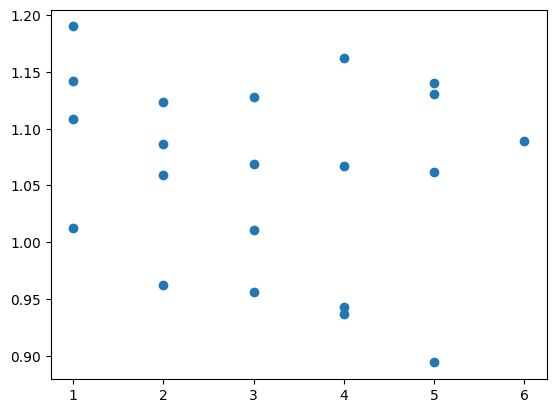

In [87]:
plt.scatter(steps_arr, goodness_arr)

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:28<00:00,  5.73s/it]


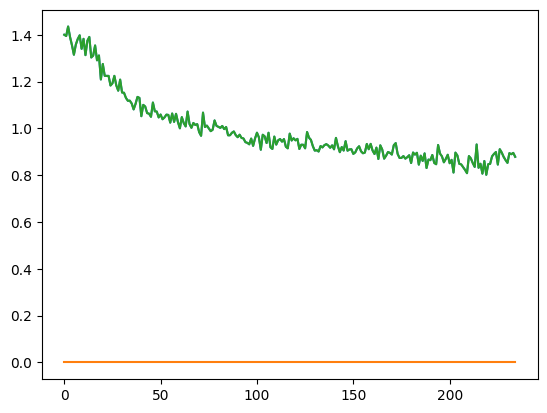

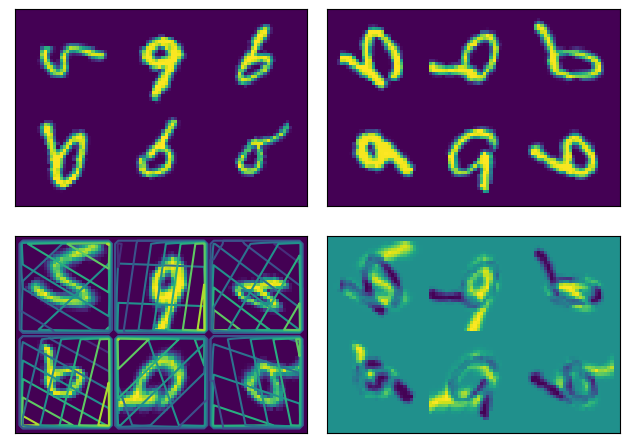

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:28<00:00,  5.64s/it]


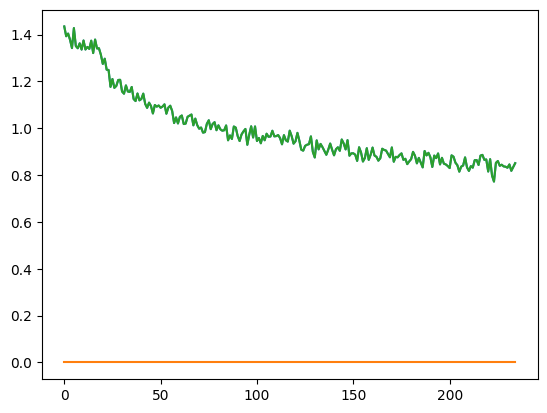

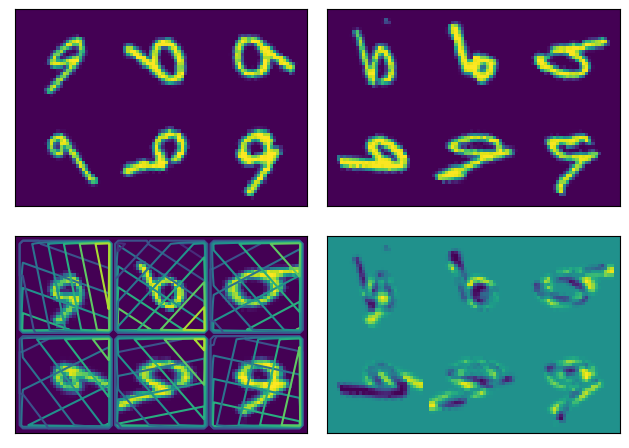

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:28<00:00,  5.72s/it]


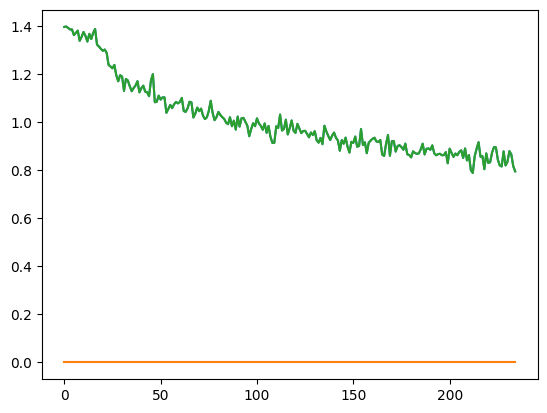

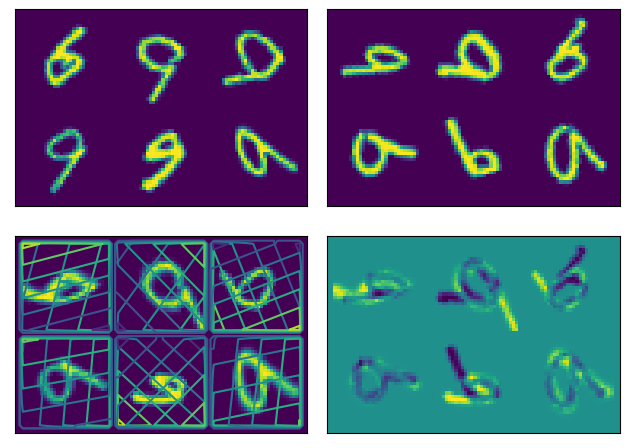

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:28<00:00,  5.73s/it]


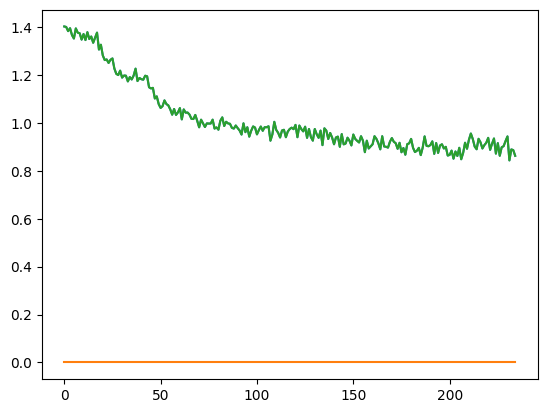

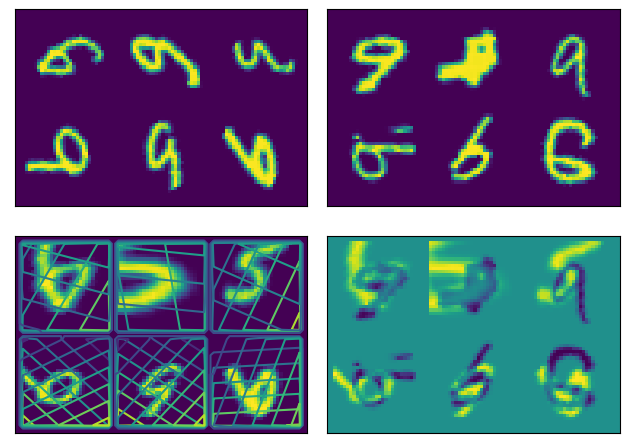

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  5.97s/it]


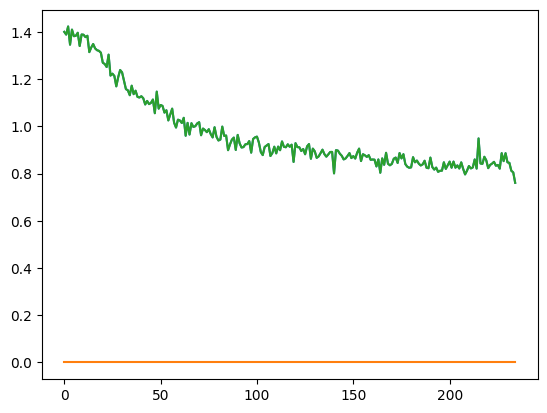

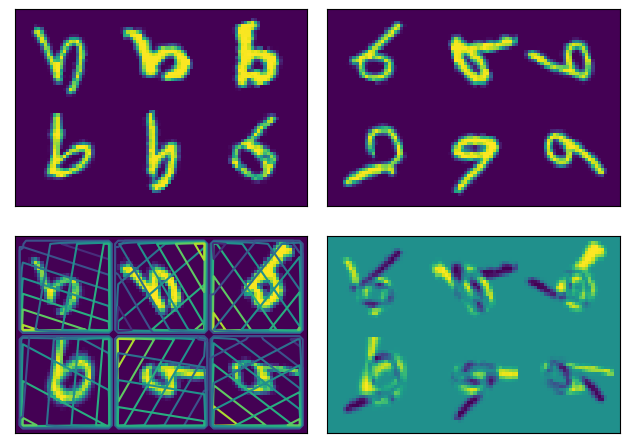

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:25<00:00,  5.00s/it]


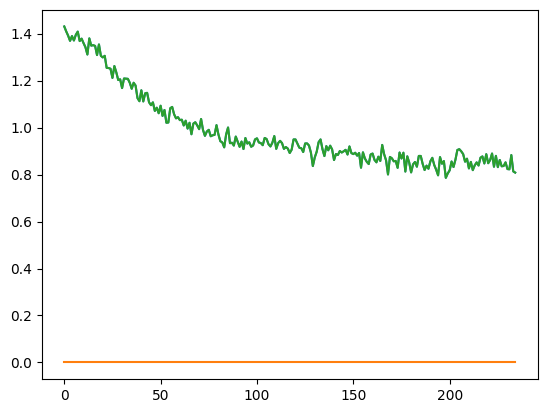

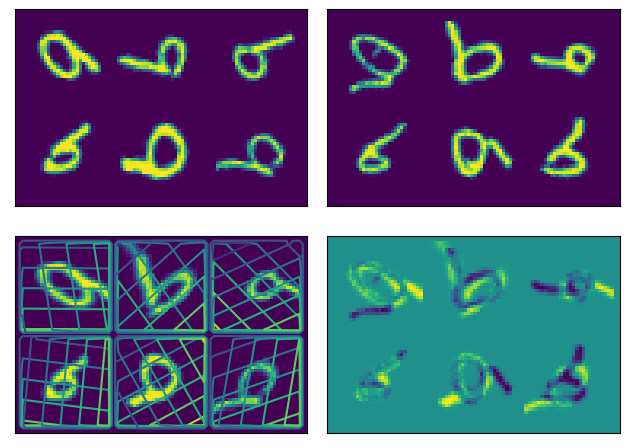

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  5.86s/it]


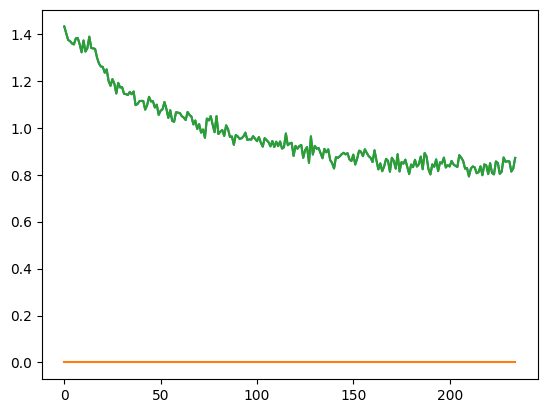

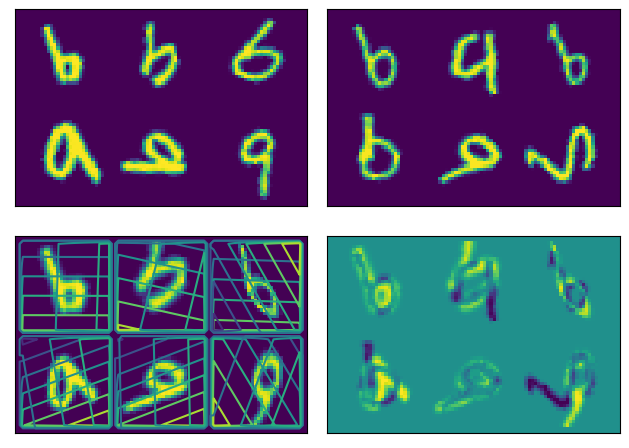

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:31<00:00,  6.27s/it]


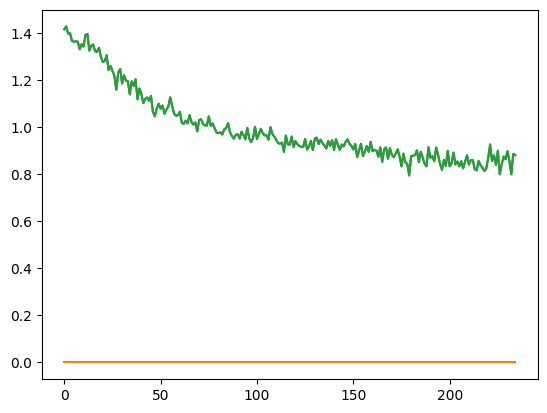

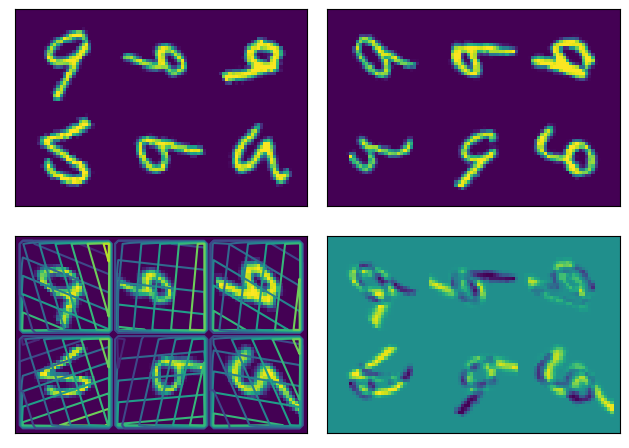

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:34<00:00,  6.92s/it]


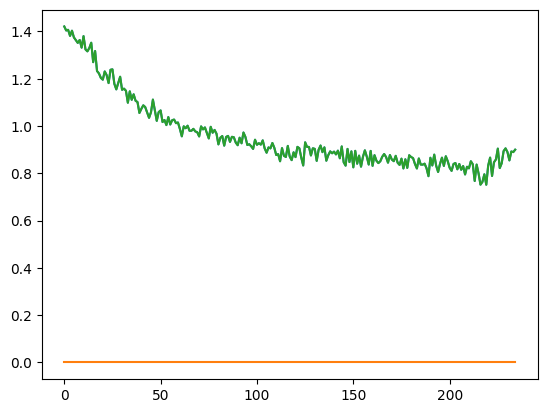

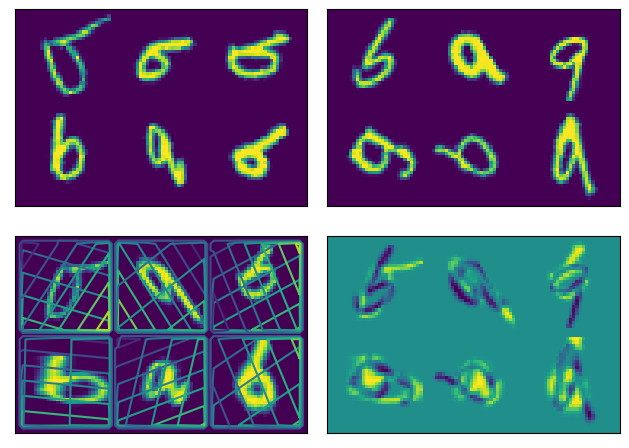

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:32<00:00,  6.50s/it]


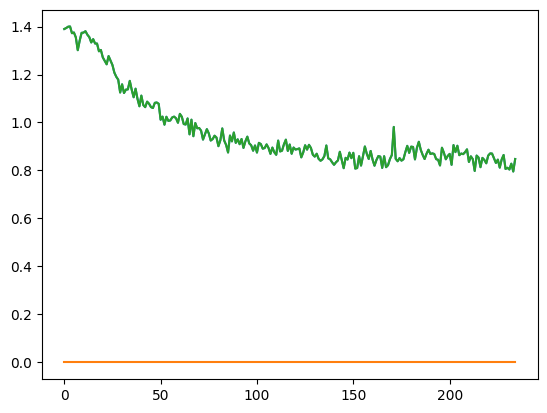

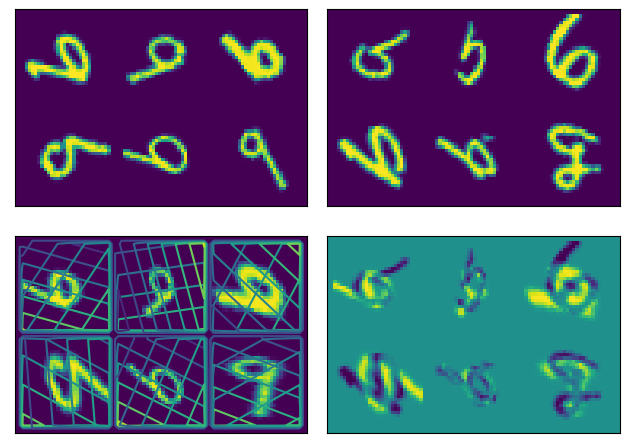

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:33<00:00,  6.79s/it]


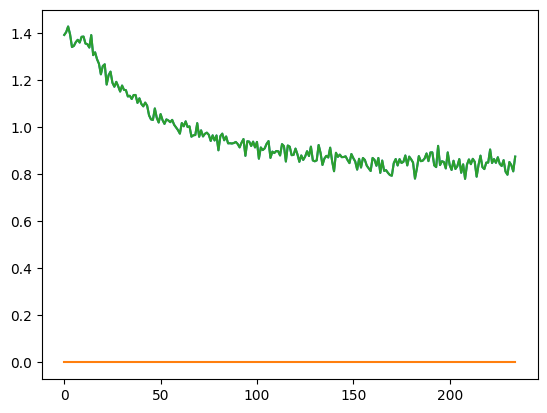

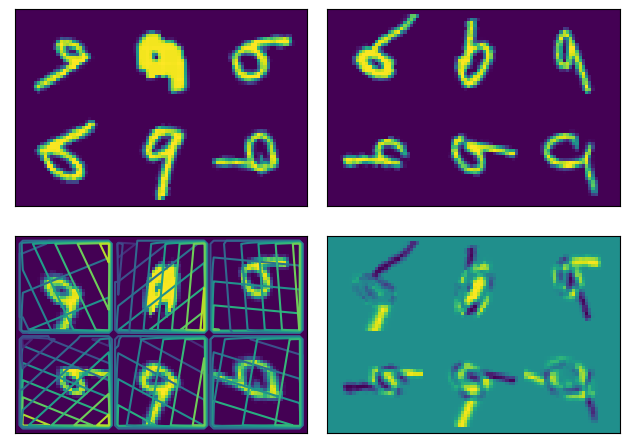

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:32<00:00,  6.56s/it]


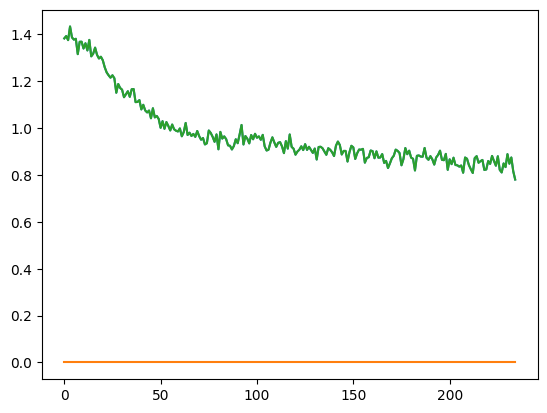

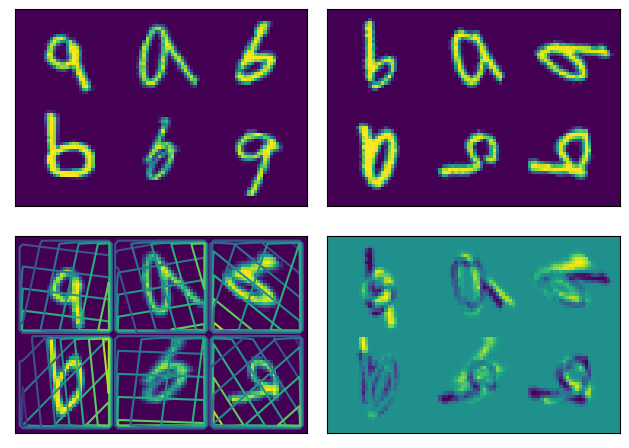

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:36<00:00,  7.30s/it]


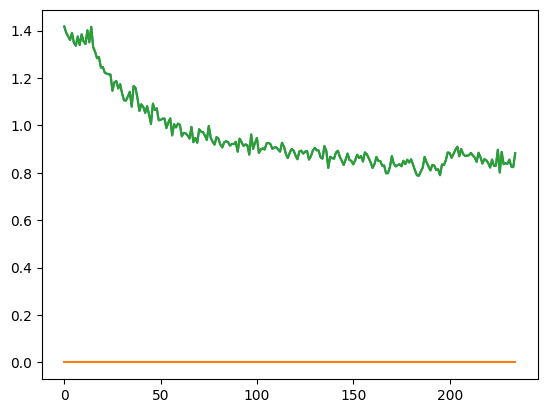

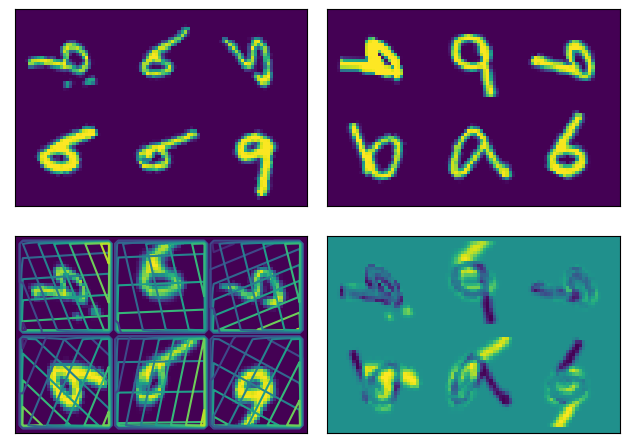

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:37<00:00,  7.45s/it]


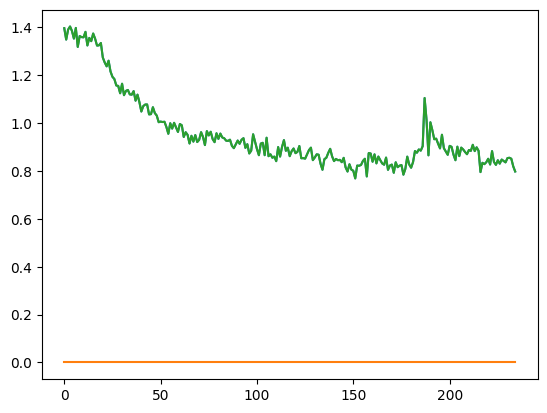

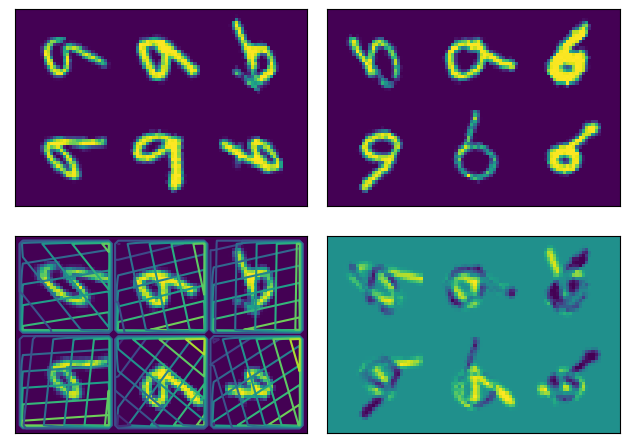

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:38<00:00,  7.62s/it]


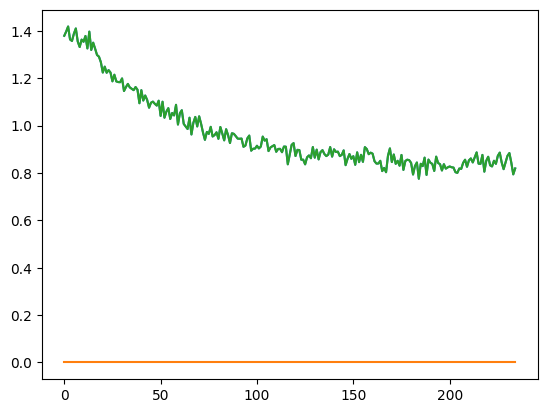

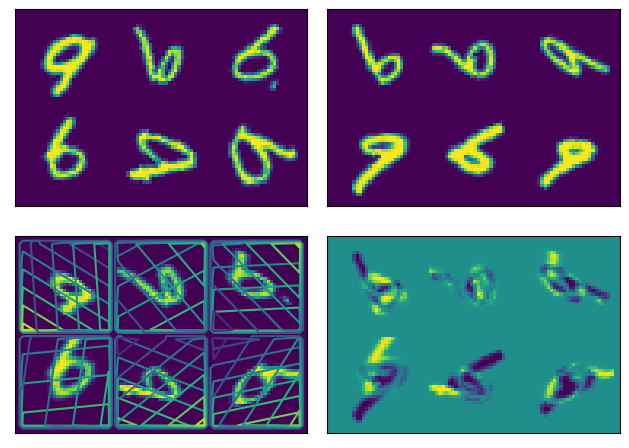

 40%|█████████████████████████████████▏                                                 | 2/5 [00:18<00:27,  9.22s/it]


KeyboardInterrupt: 

In [90]:
#steps_arr_diff = []
#goodness_arr_diff = []

for n_steps in range(6):
    for samples in range(4):
        regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

        inner_net = regnet

        for _ in range(n_steps):
             regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))
             inner_net = icon.TwoStepRegistration(
                 inner_net,
                 regnet
             )

        net = icon.losses.BendingEnergyNet(inner_net, icon.LNCC(sigma=4), lmbda=.1)

        goodness = performance(net, 5)
        
        steps_arr_diff.append(n_steps)
        goodness_arr_diff.append(goodness)

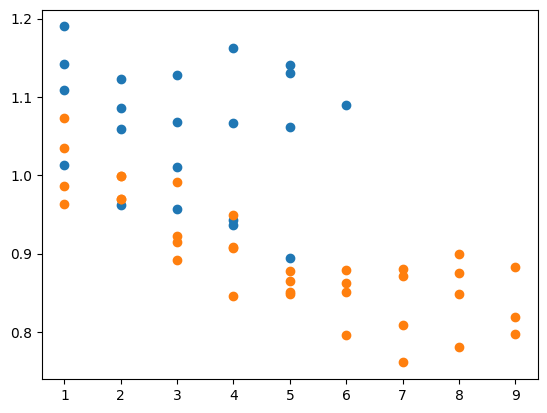

In [91]:
plt.scatter(steps_arr, goodness_arr)
plt.scatter(steps_arr_diff, goodness_arr_diff)

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.44s/it]


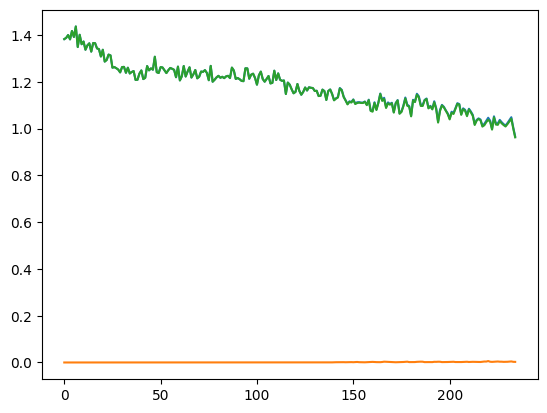

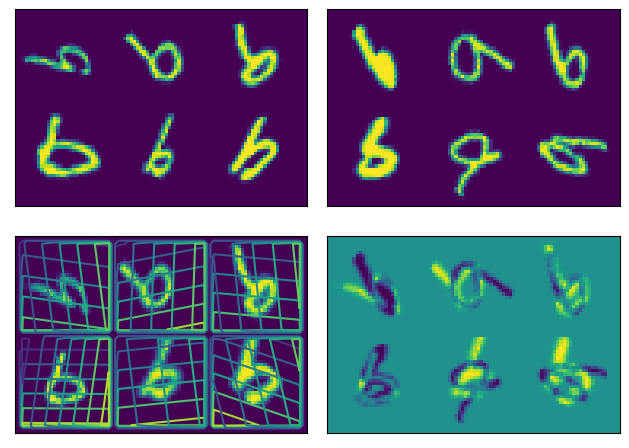

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.06s/it]


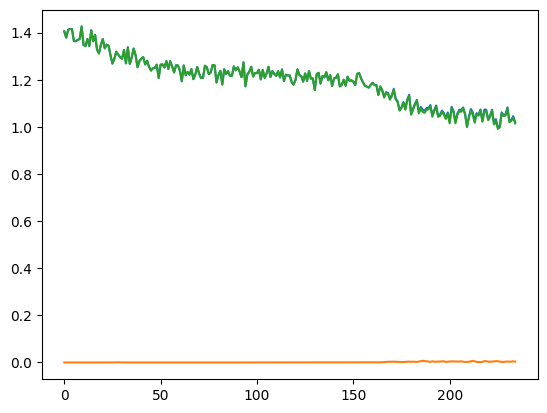

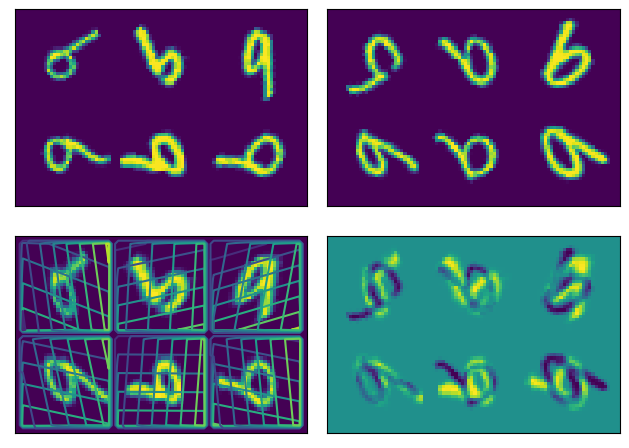

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.58s/it]


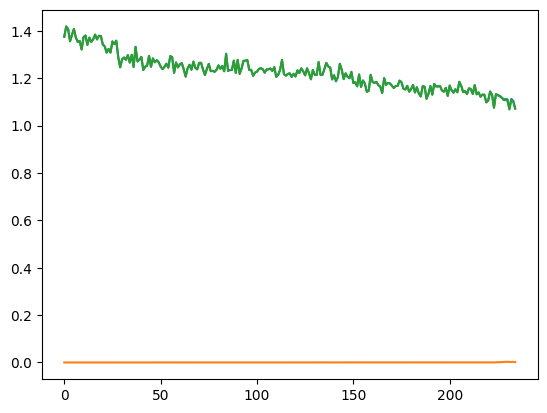

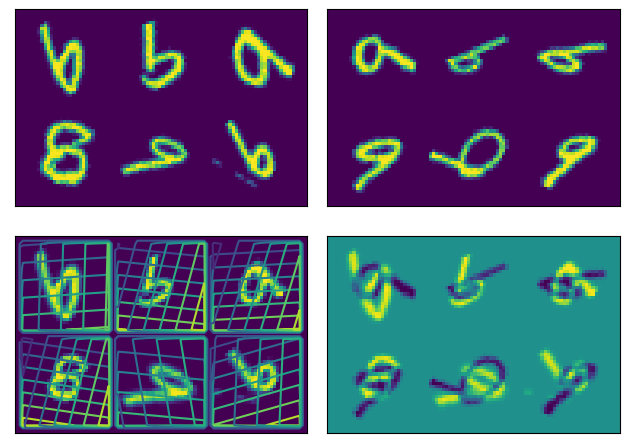

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.56s/it]


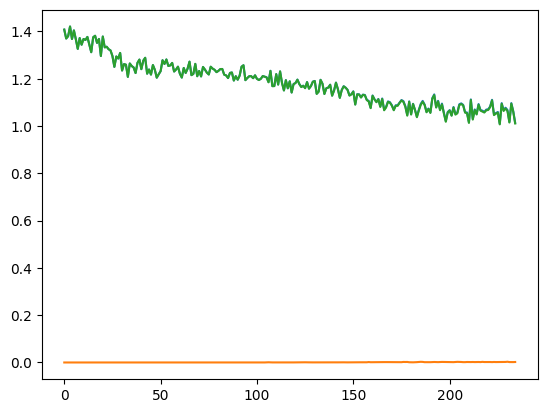

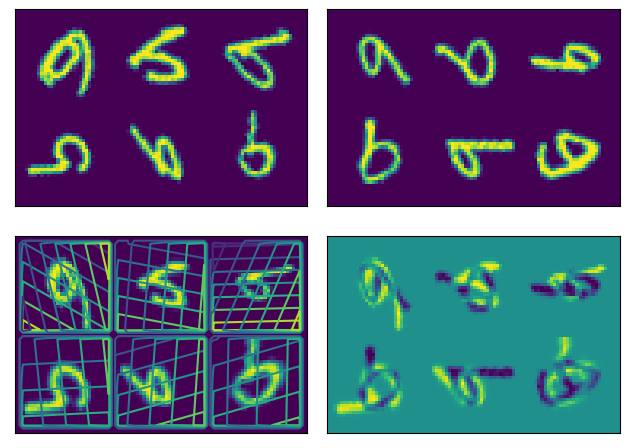

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:24<00:00,  4.93s/it]


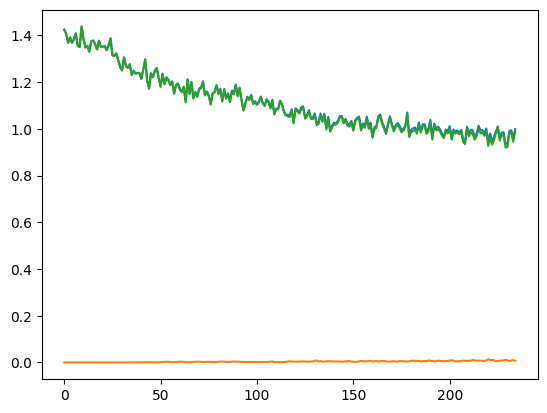

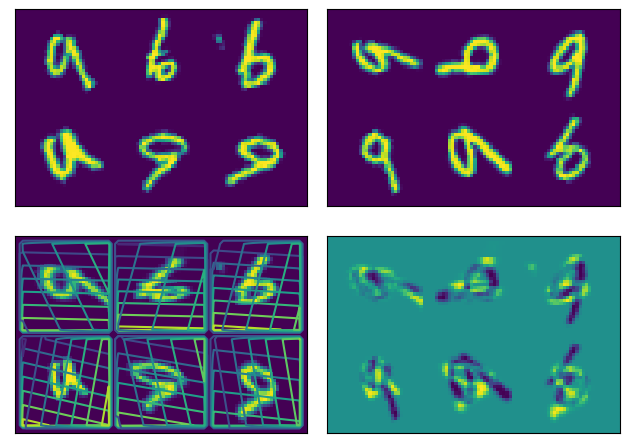

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:24<00:00,  4.83s/it]


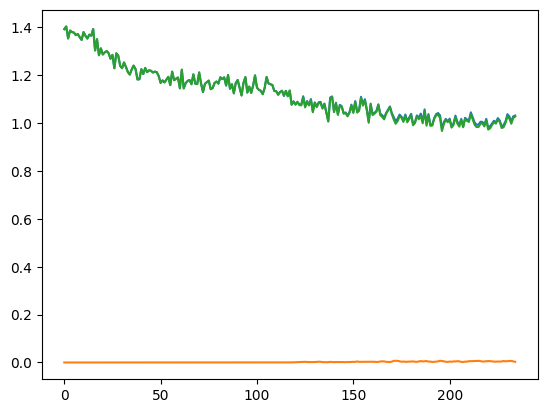

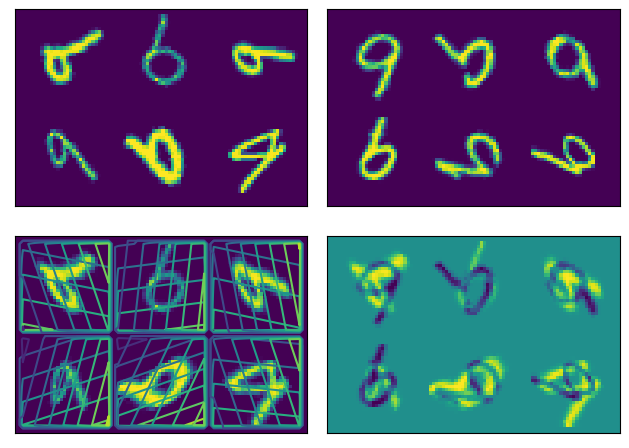

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:24<00:00,  4.94s/it]


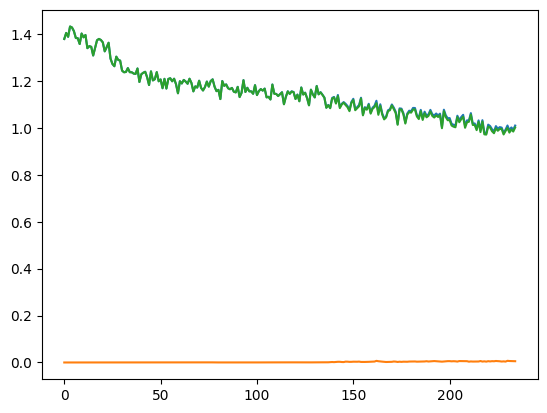

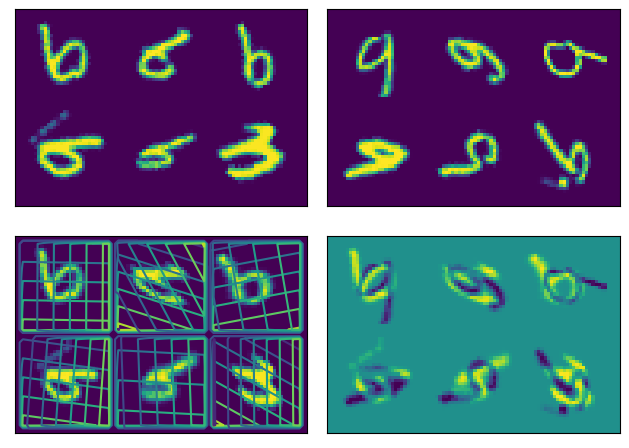

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:24<00:00,  4.90s/it]


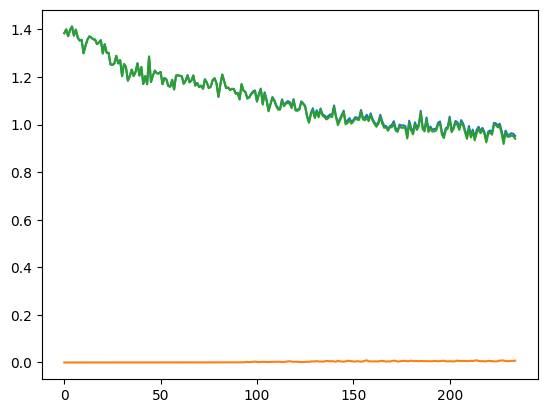

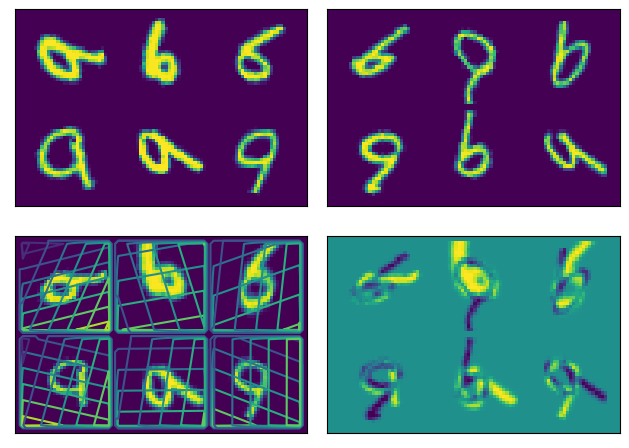

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.11s/it]


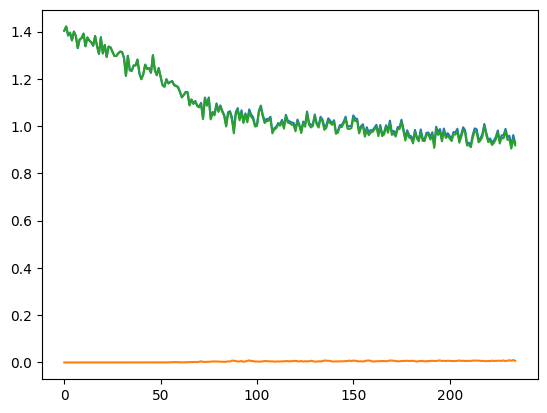

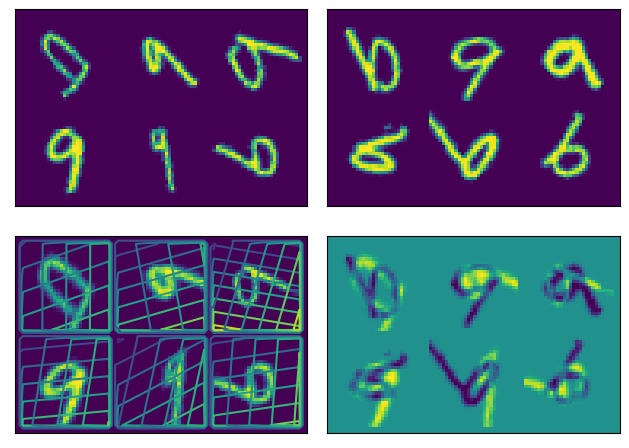

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.10s/it]


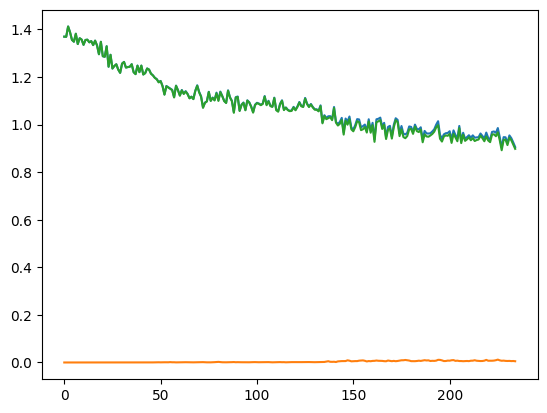

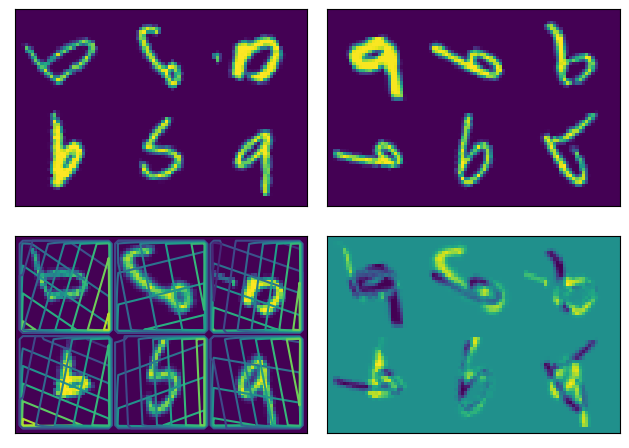

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.18s/it]


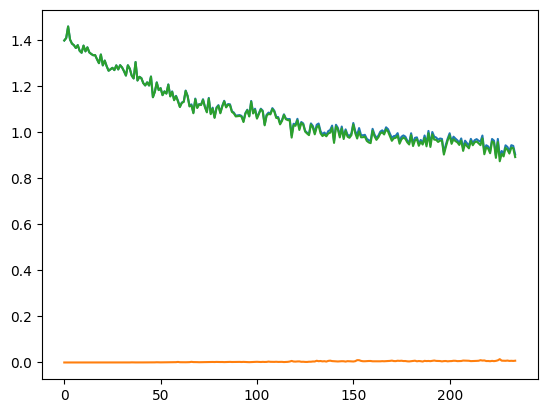

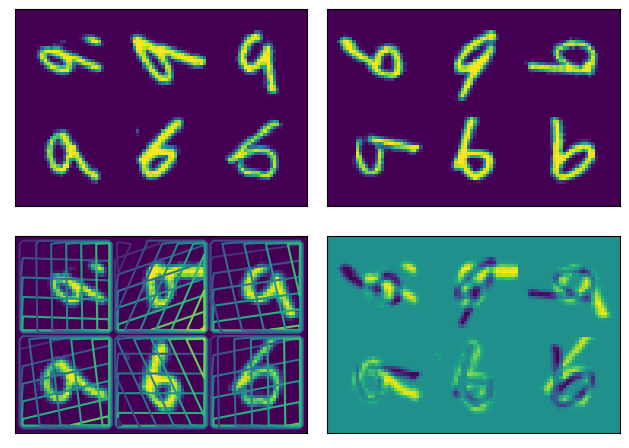

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:31<00:00,  6.22s/it]


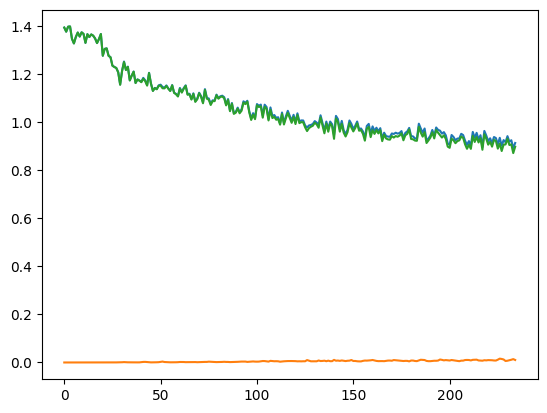

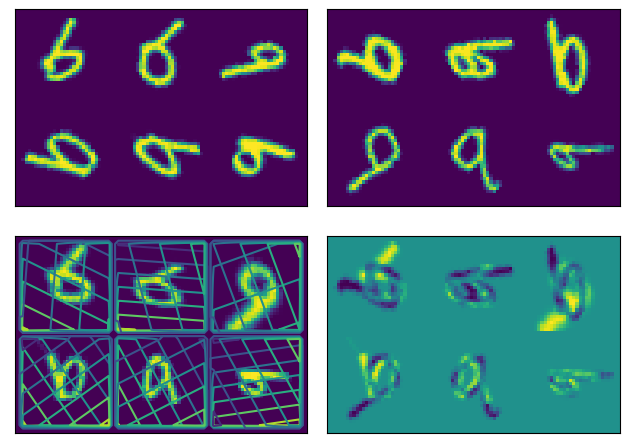

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:37<00:00,  7.45s/it]


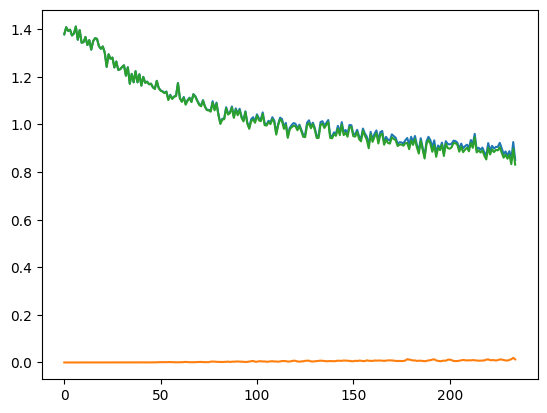

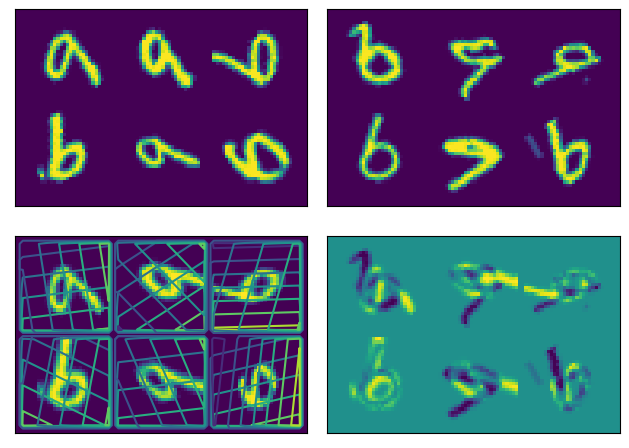

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:37<00:00,  7.59s/it]


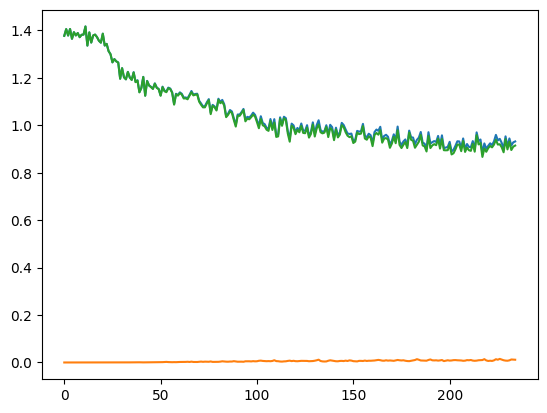

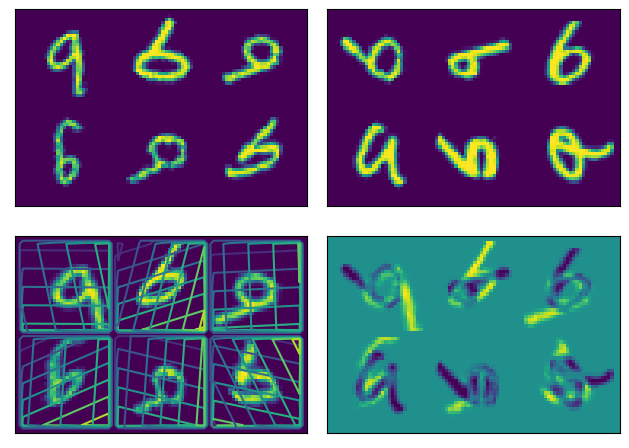

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:37<00:00,  7.51s/it]


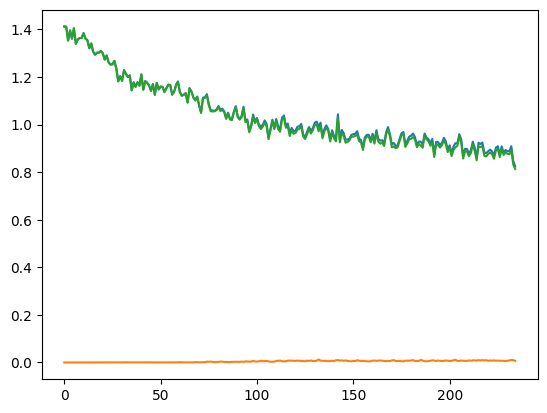

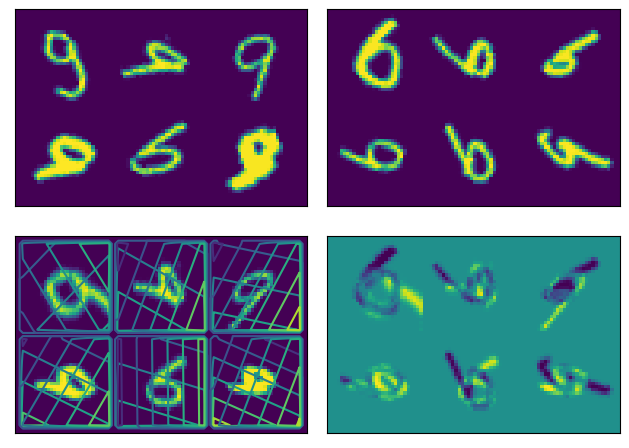

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:37<00:00,  7.52s/it]


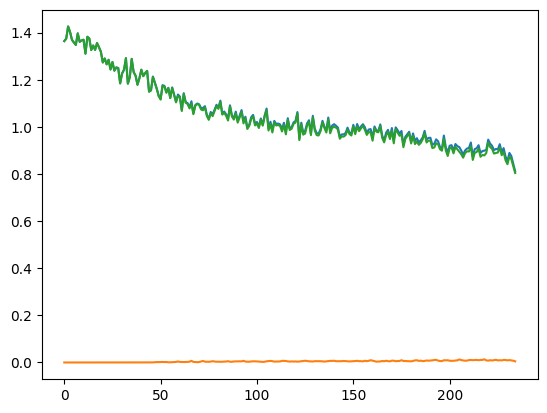

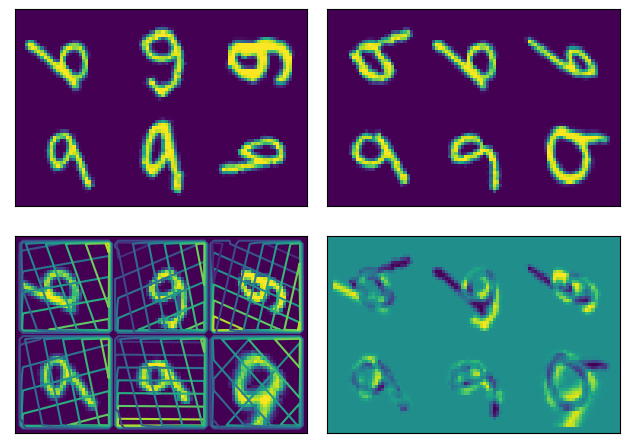

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:43<00:00,  8.76s/it]


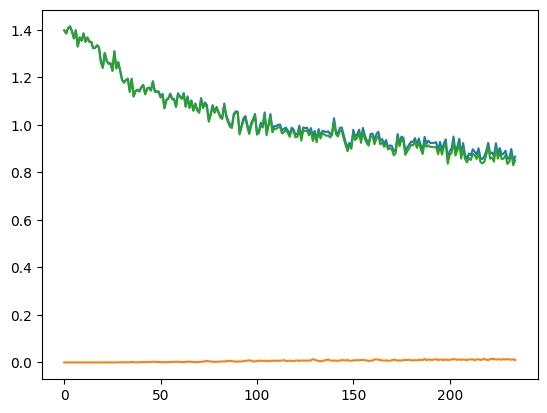

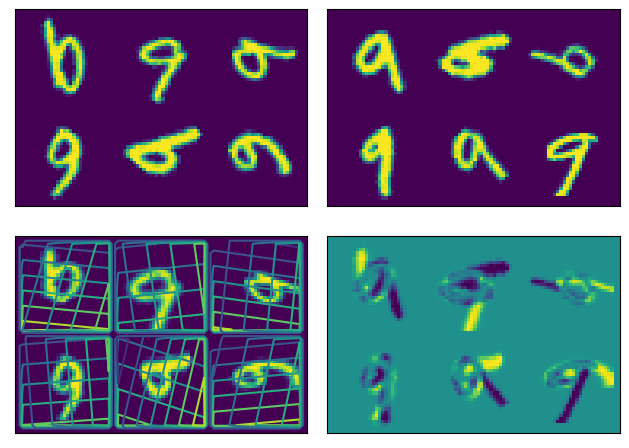

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:43<00:00,  8.67s/it]


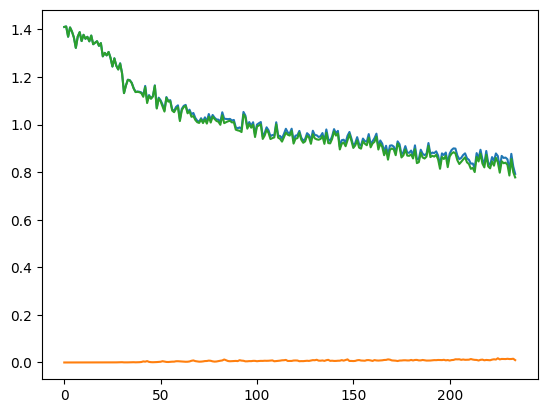

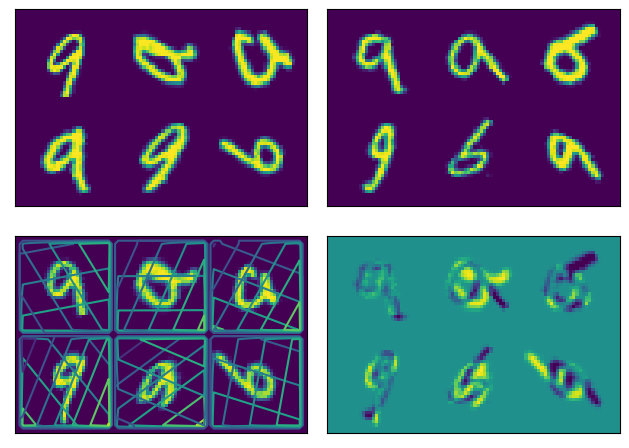

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:45<00:00,  9.03s/it]


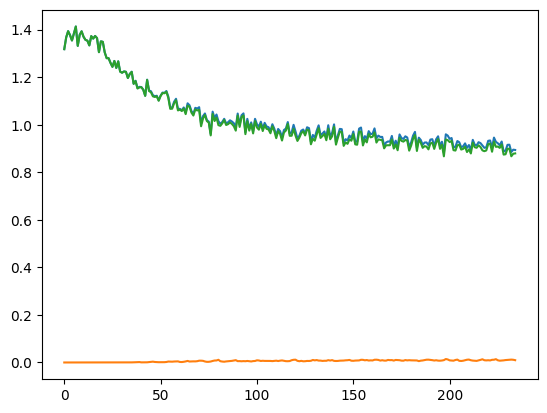

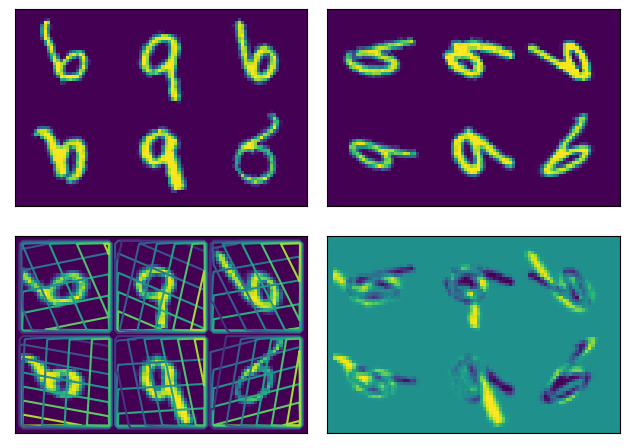

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:43<00:00,  8.65s/it]


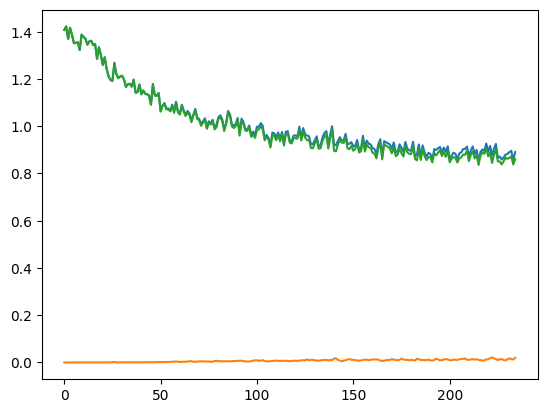

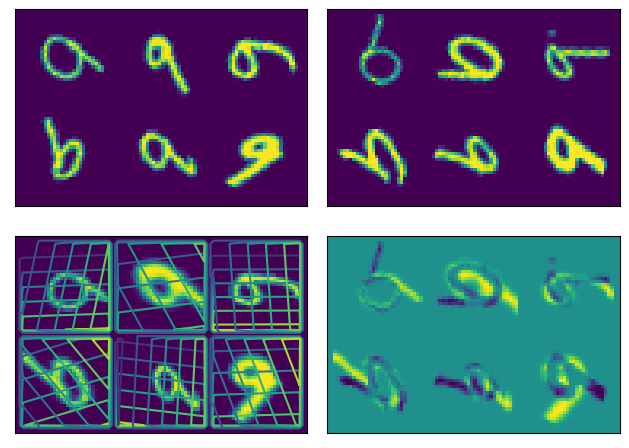

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:48<00:00,  9.66s/it]


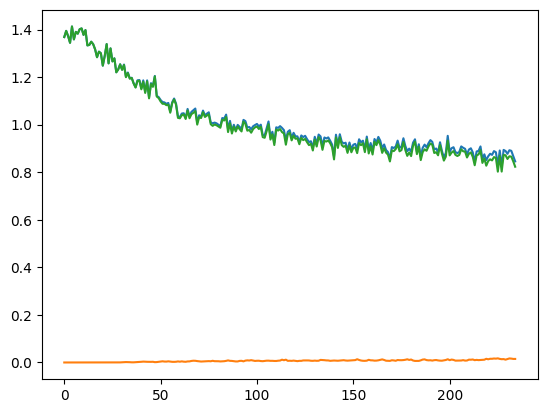

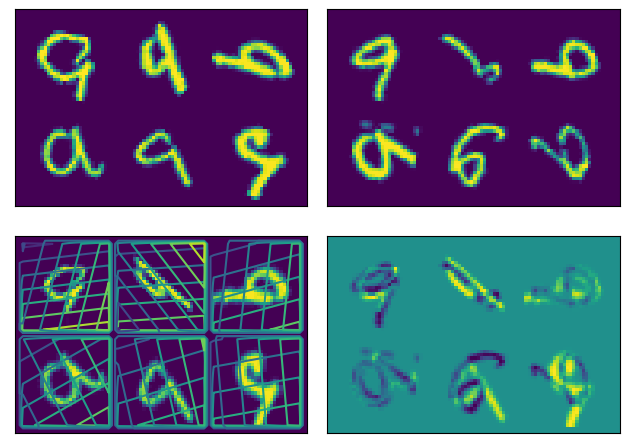

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:51<00:00, 10.28s/it]


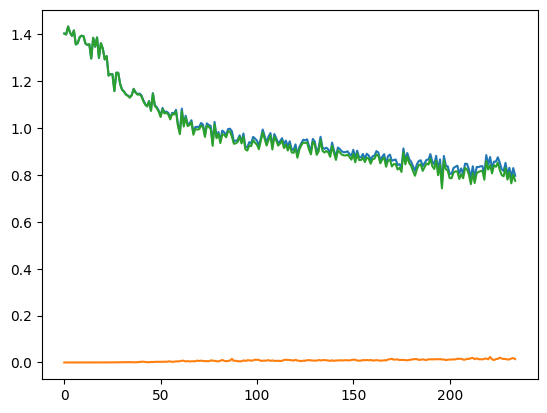

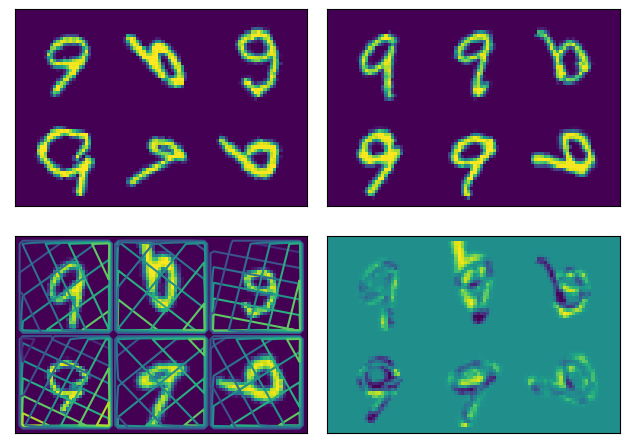

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:47<00:00,  9.40s/it]


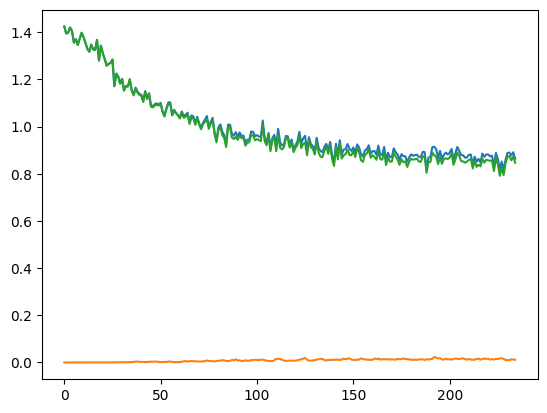

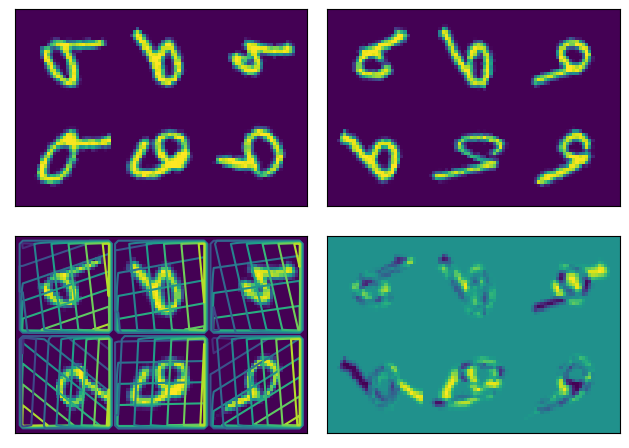

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:42<00:00,  8.53s/it]


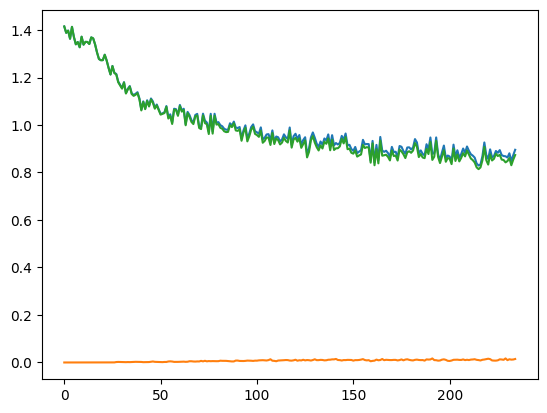

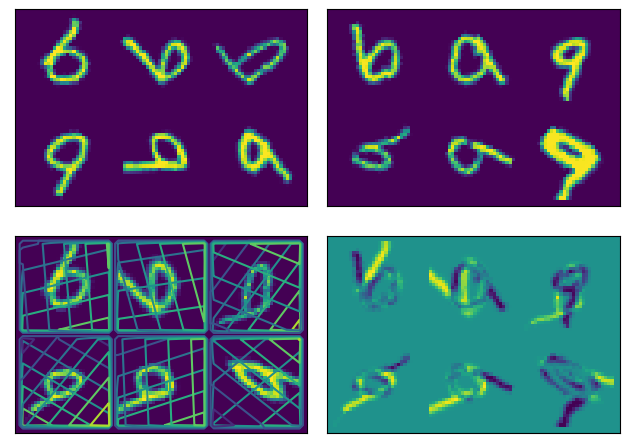

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:55<00:00, 11.14s/it]


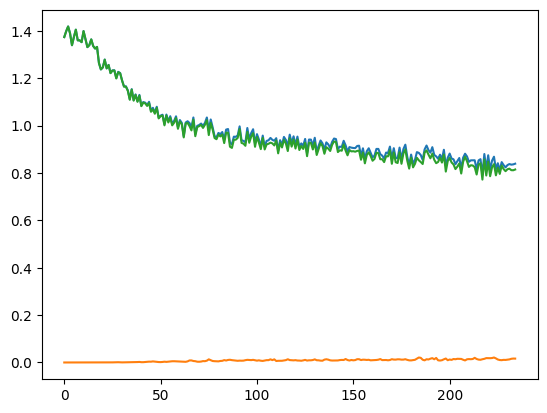

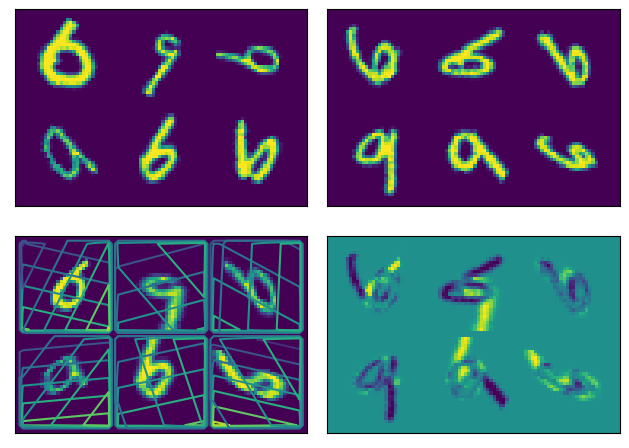

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:57<00:00, 11.42s/it]


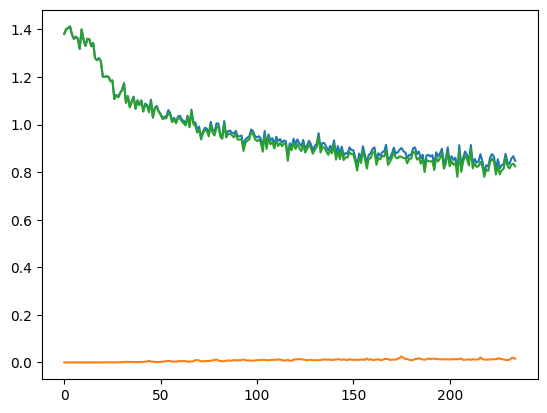

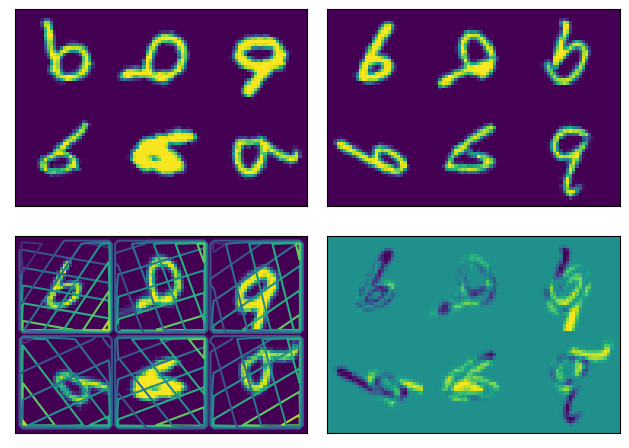

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:56<00:00, 11.36s/it]


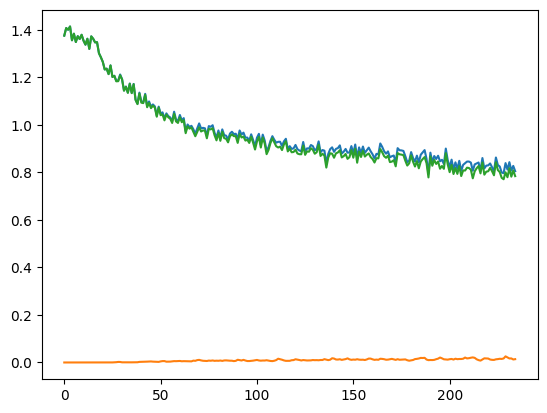

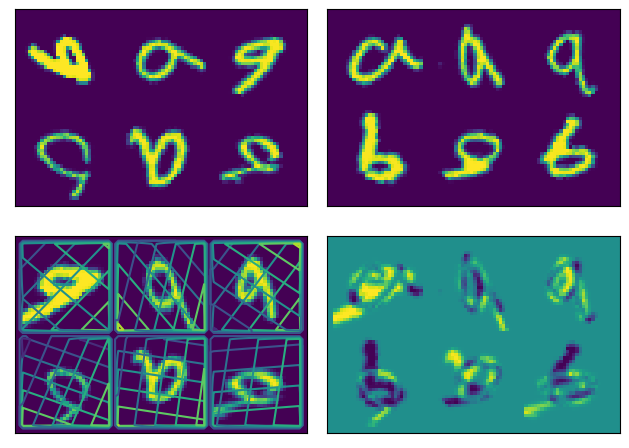

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:57<00:00, 11.47s/it]


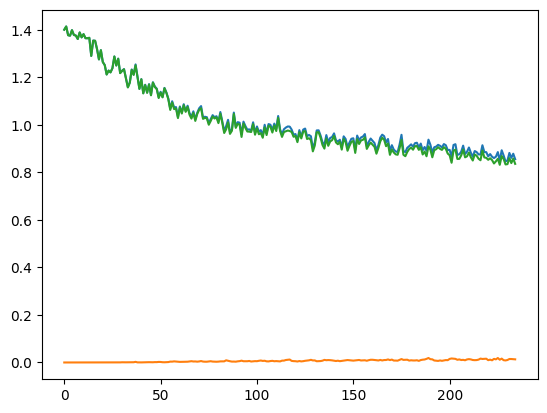

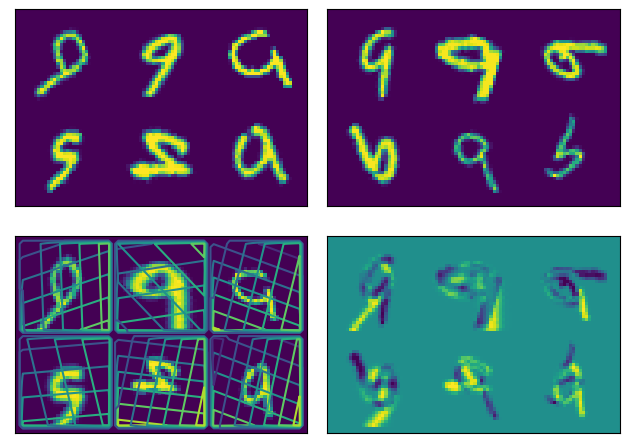

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:03<00:00, 12.68s/it]


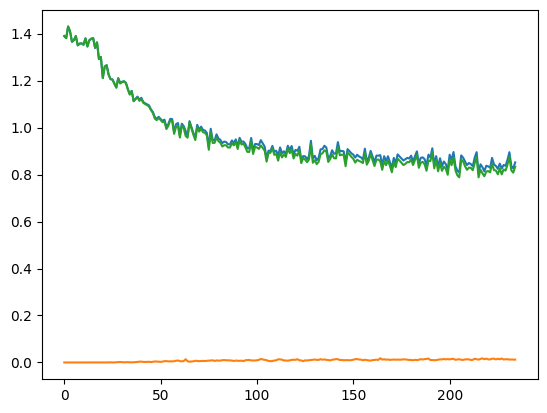

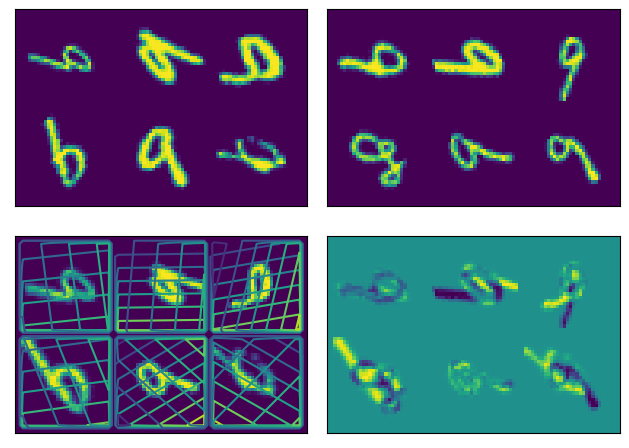

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:04<00:00, 12.95s/it]


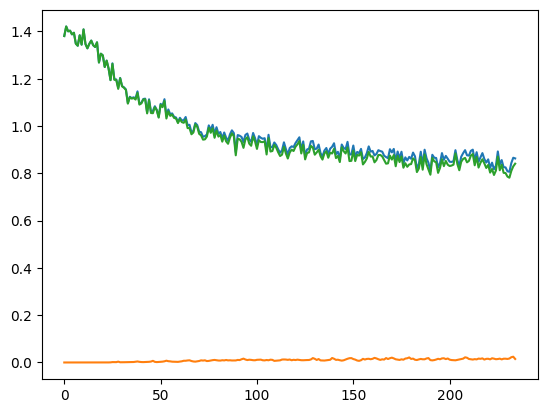

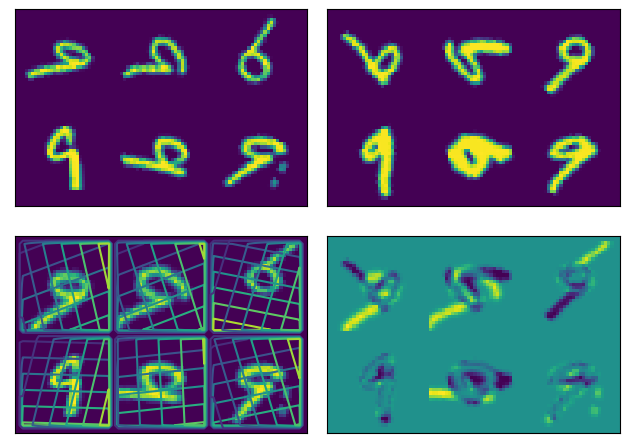

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:03<00:00, 12.78s/it]


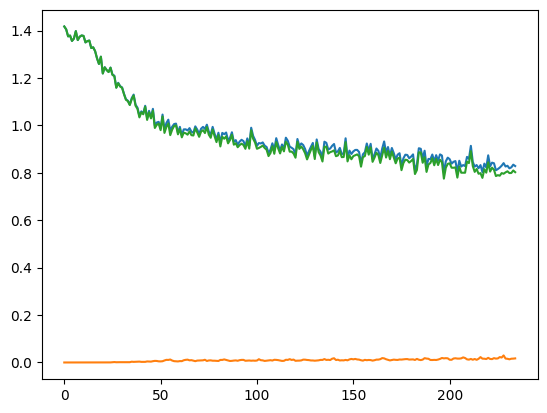

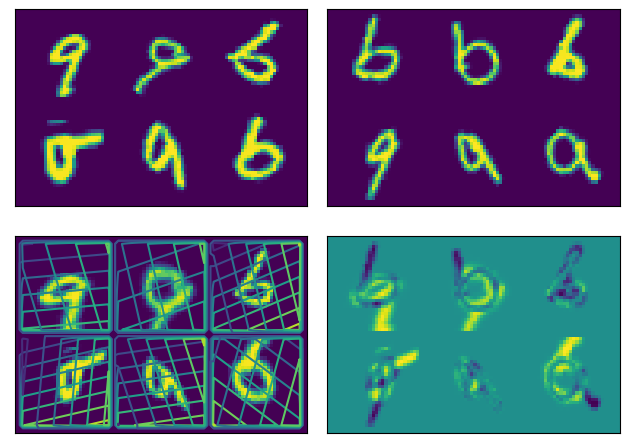

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:03<00:00, 12.70s/it]


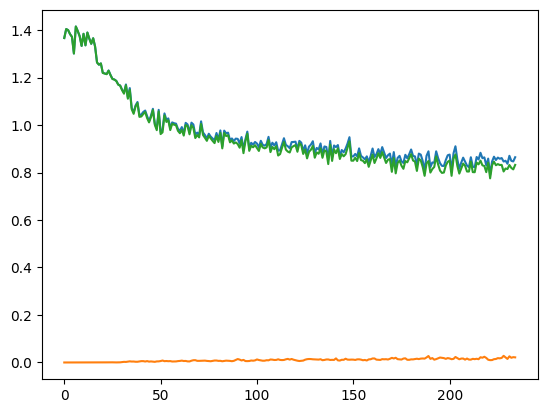

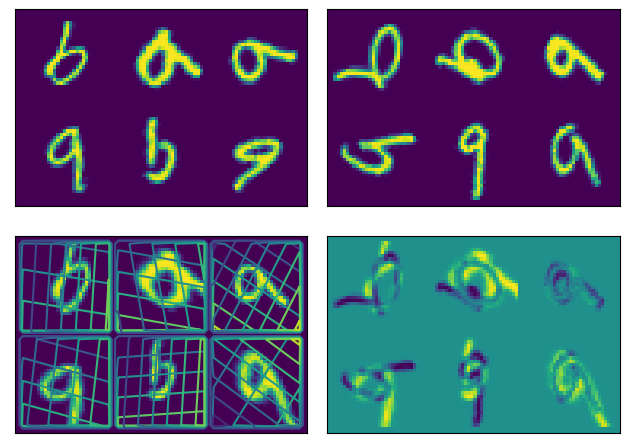

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:10<00:00, 14.04s/it]


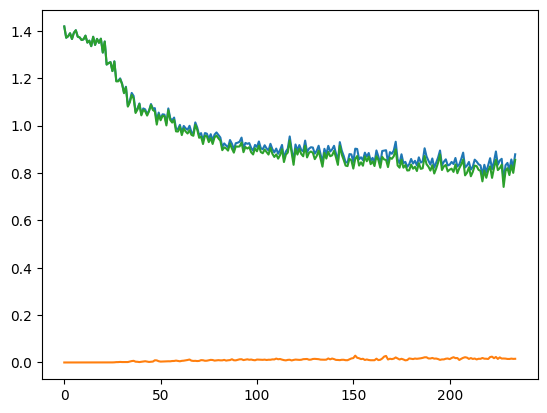

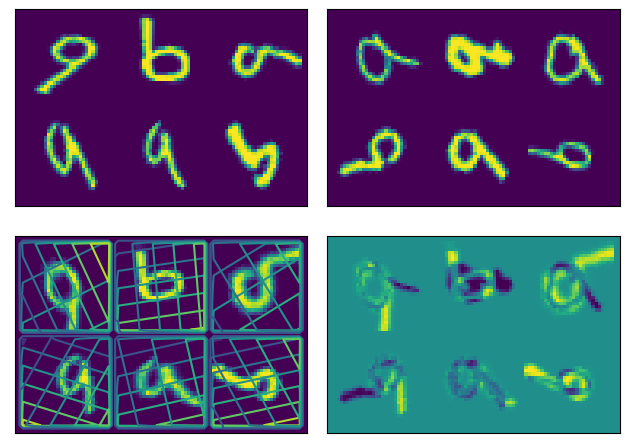

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:11<00:00, 14.21s/it]


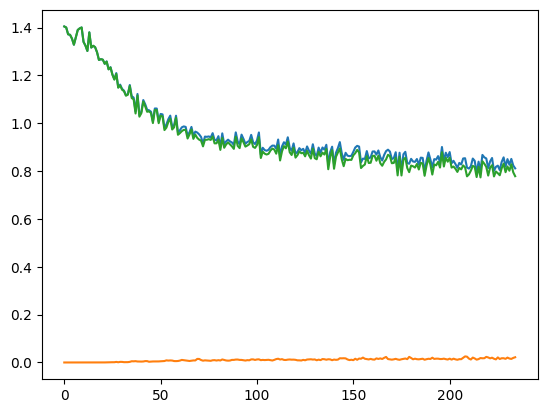

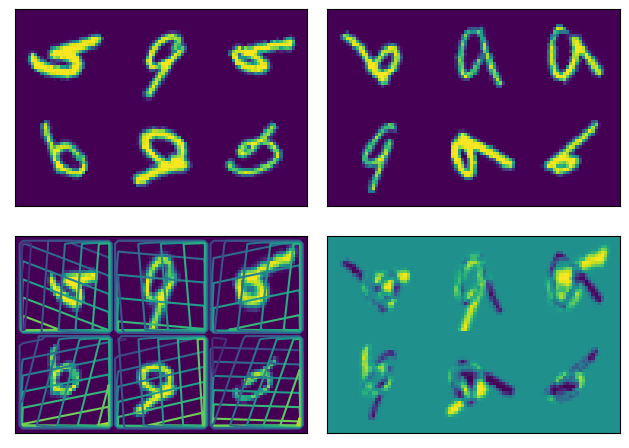

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:13<00:00, 14.66s/it]


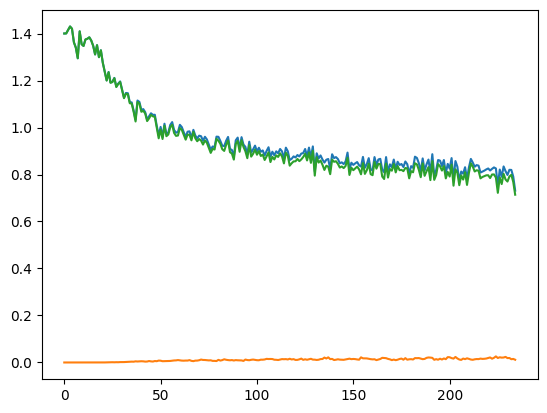

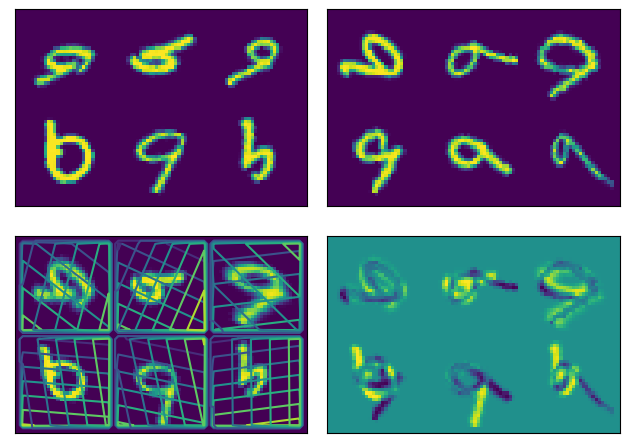

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [01:11<00:00, 14.29s/it]


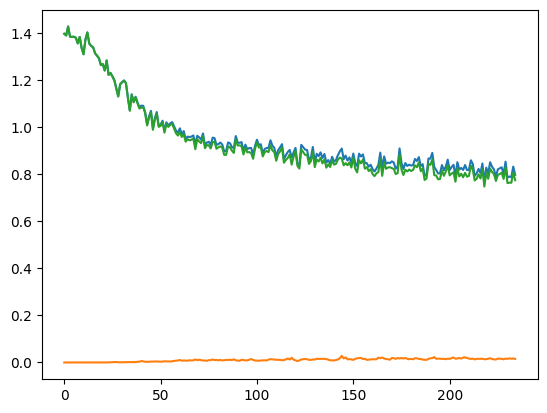

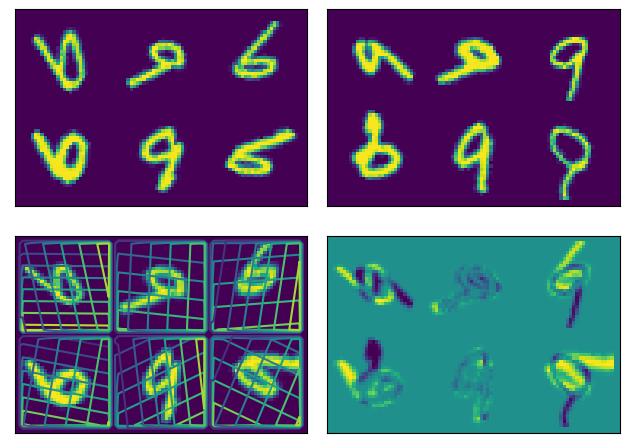

In [92]:
steps_arr_gricon = []
goodness_arr_gricon = []

for n_steps in range(1, 10):
    for samples in range(4):
        regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

        inner_net = regnet

        for _ in range(n_steps):
             regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))
             inner_net = icon.TwoStepRegistration(
                 inner_net,
                 regnet
             )

        net = icon.losses.GradientICON(inner_net, icon.LNCC(sigma=4), lmbda=1.5)

        goodness = performance(net, 5)
        
        steps_arr_gricon.append(n_steps)
        goodness_arr_gricon.append(goodness)

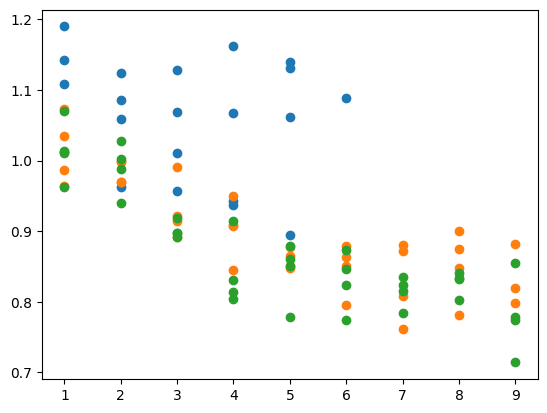

In [93]:
plt.scatter(steps_arr, goodness_arr)
plt.scatter(steps_arr_diff, goodness_arr_diff)
plt.scatter(steps_arr_gricon, goodness_arr_gricon)

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.70s/it]


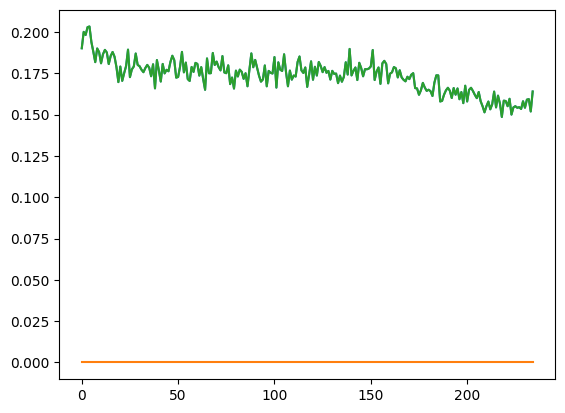

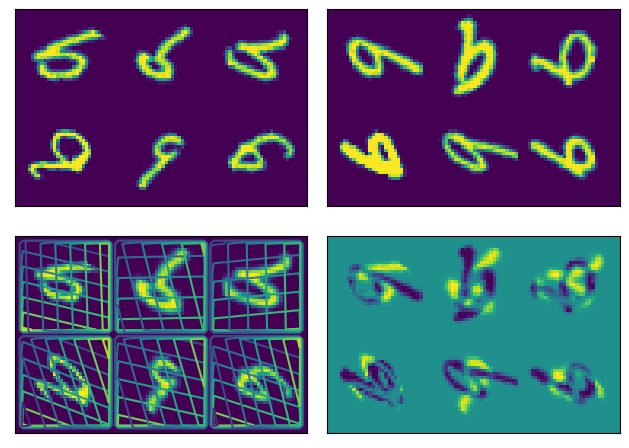

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.72s/it]


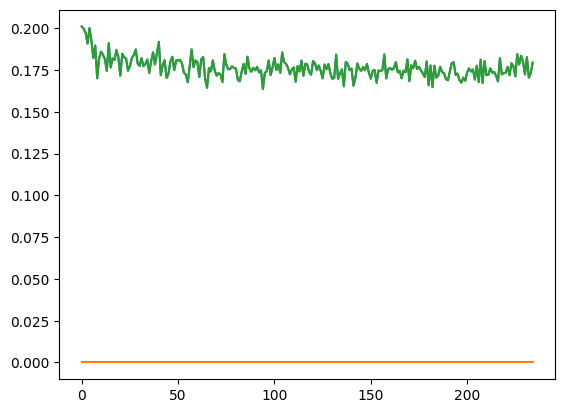

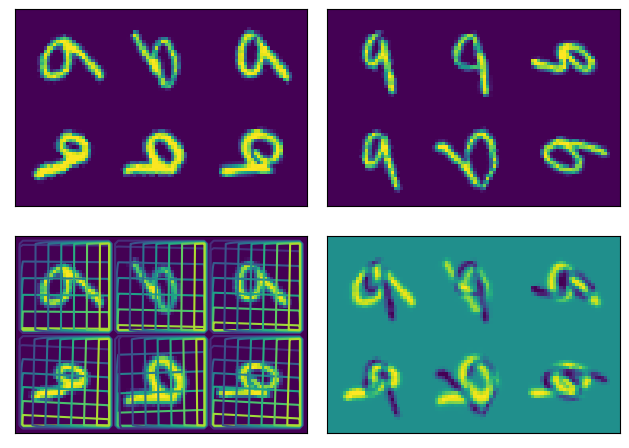

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.76s/it]


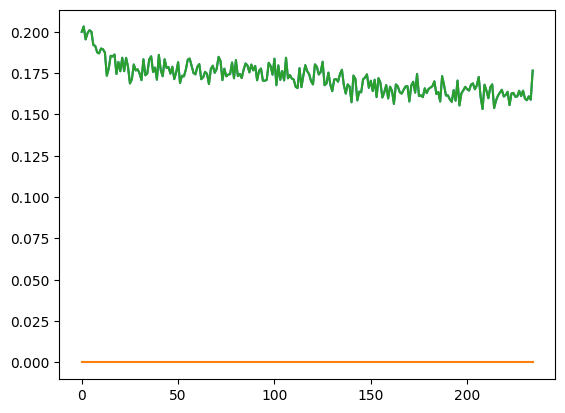

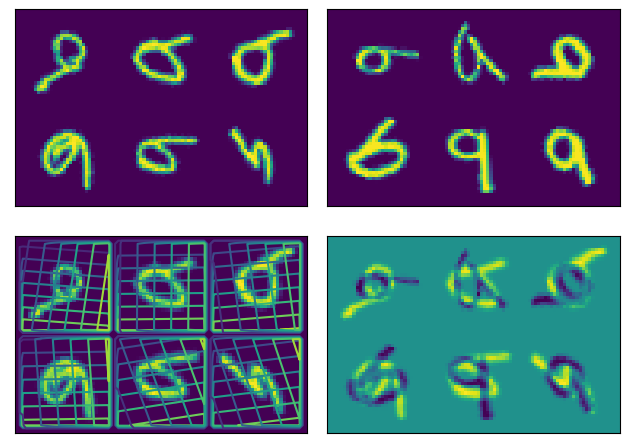

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.75s/it]


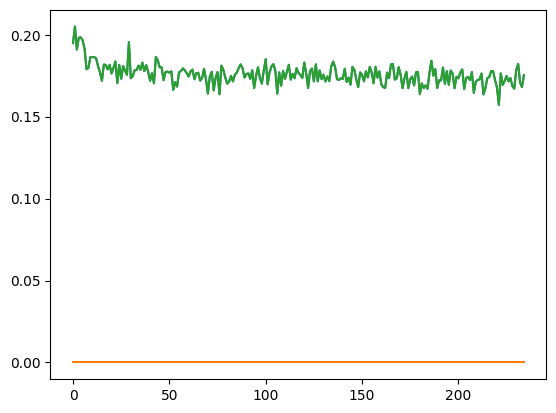

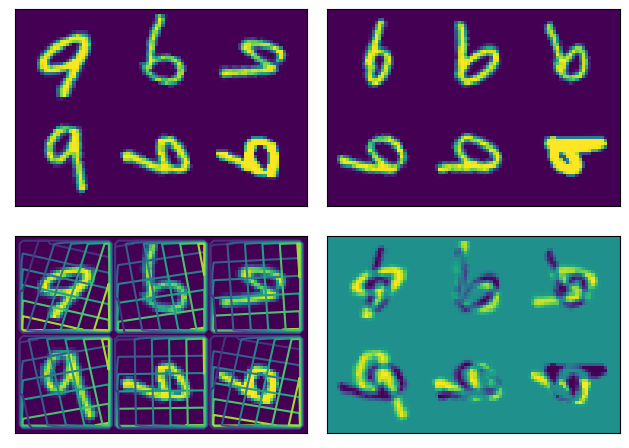

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:10<00:00,  2.19s/it]


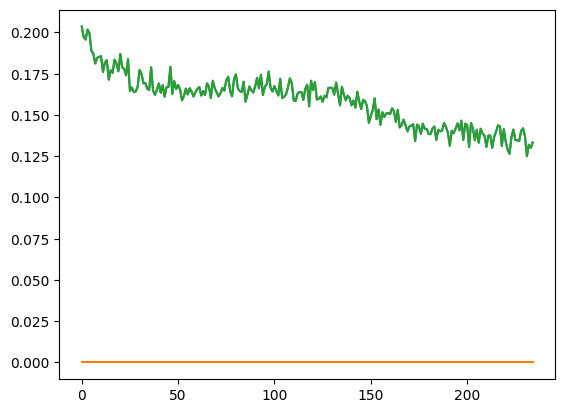

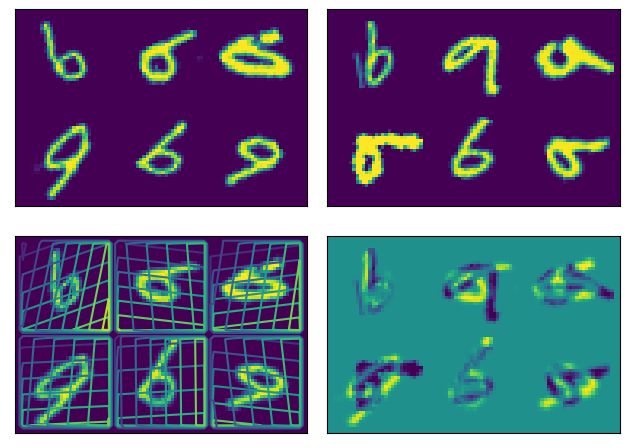

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:10<00:00,  2.15s/it]


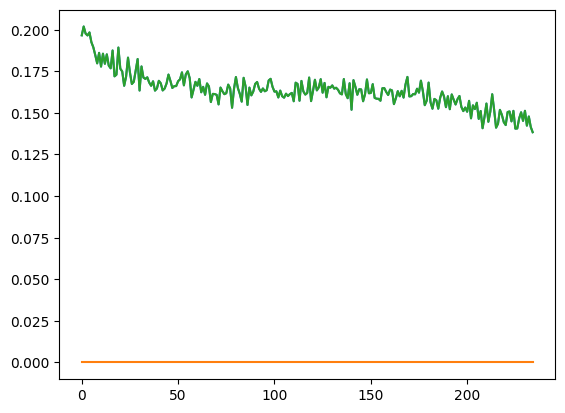

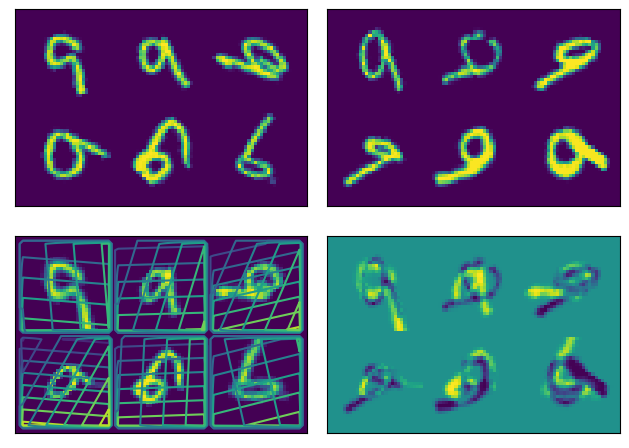

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:11<00:00,  2.23s/it]


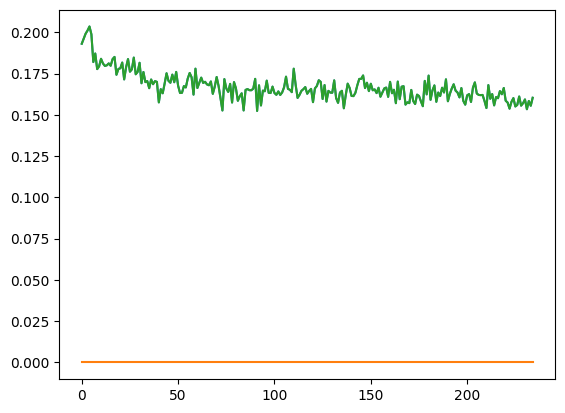

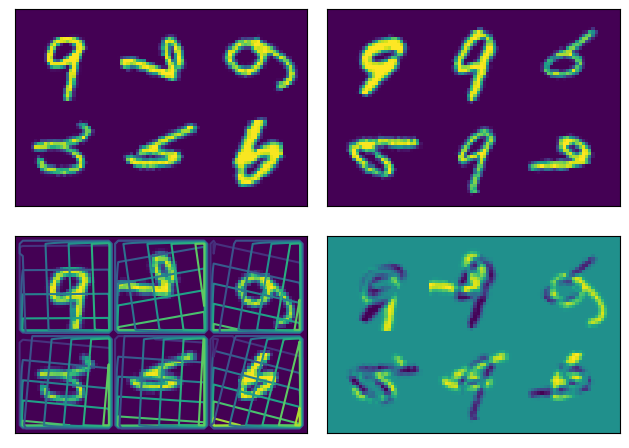

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:11<00:00,  2.27s/it]


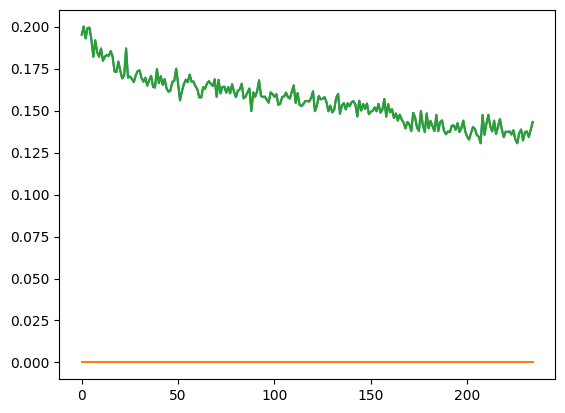

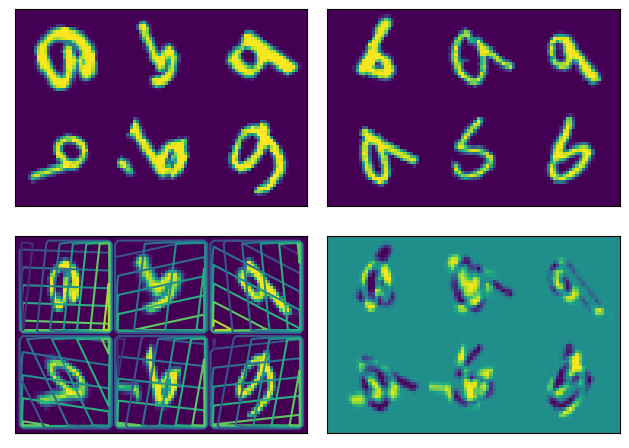

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.79s/it]


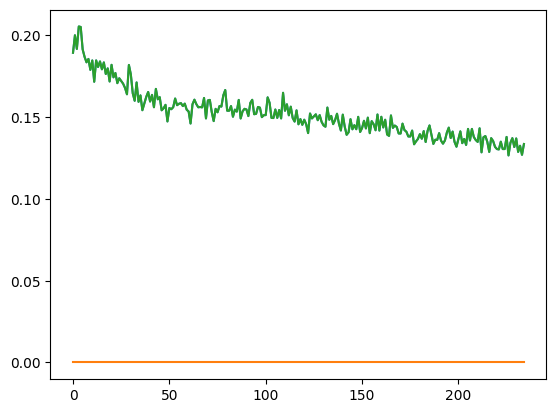

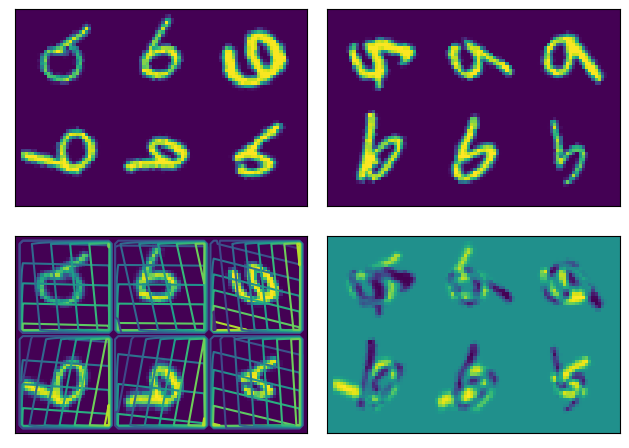

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


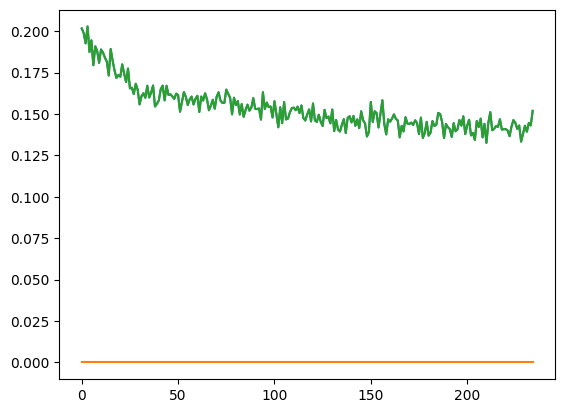

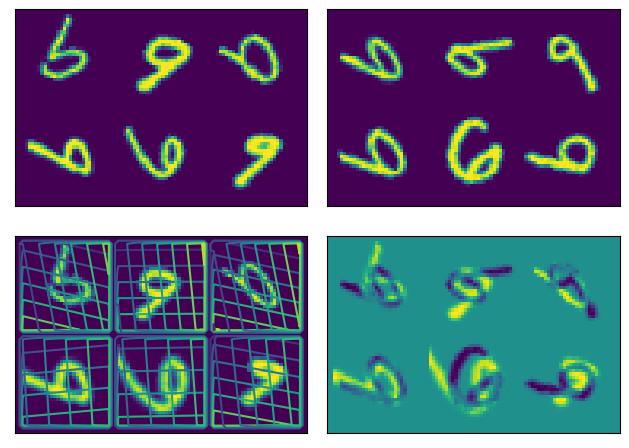

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:09<00:00,  1.92s/it]


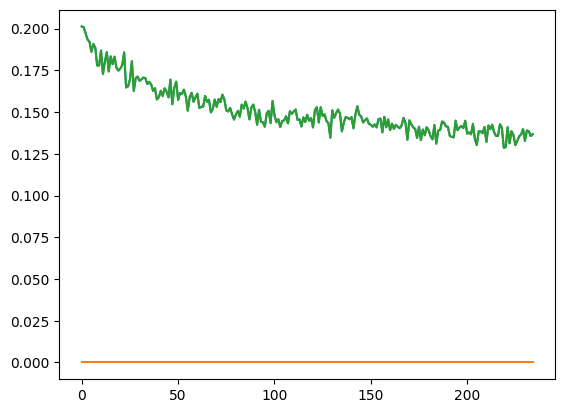

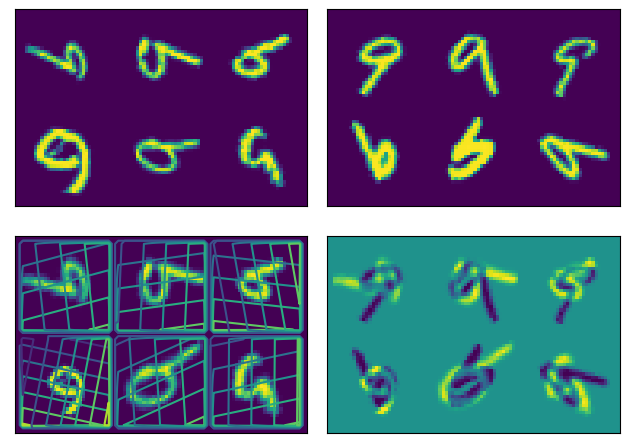

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:12<00:00,  2.59s/it]


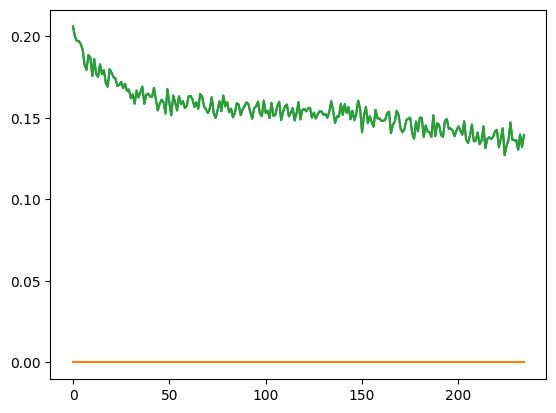

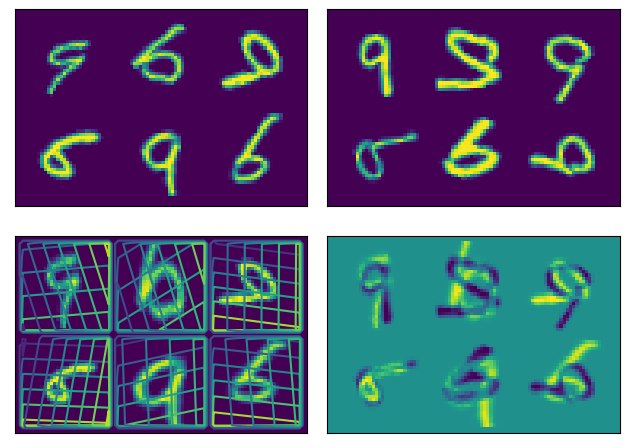

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.43s/it]


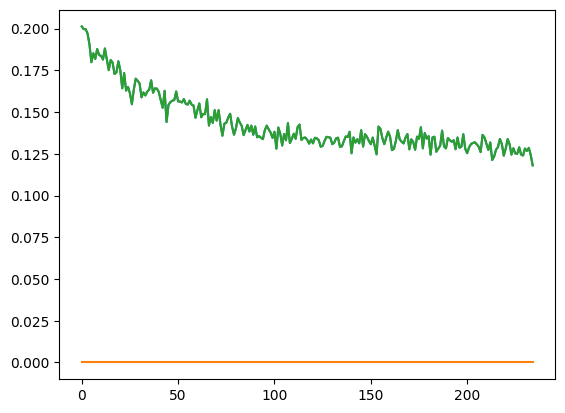

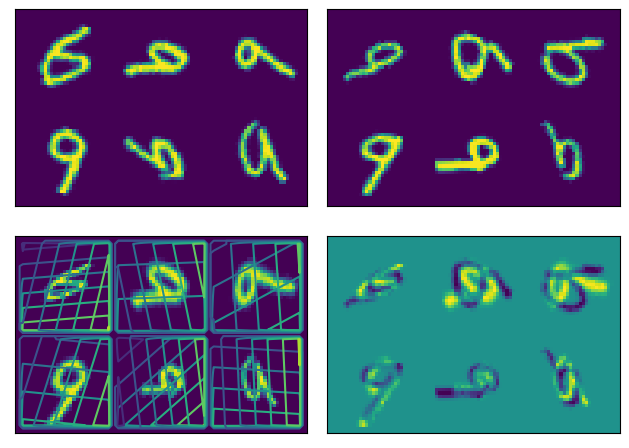

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.35s/it]


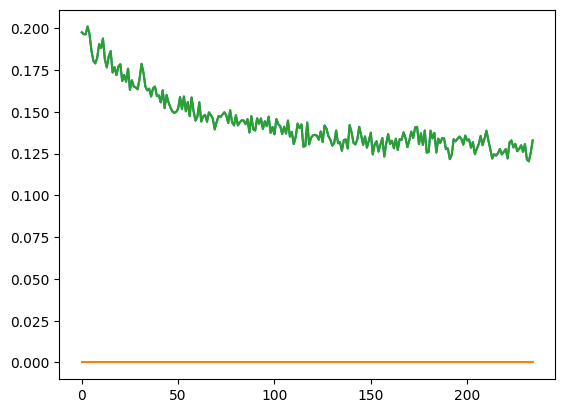

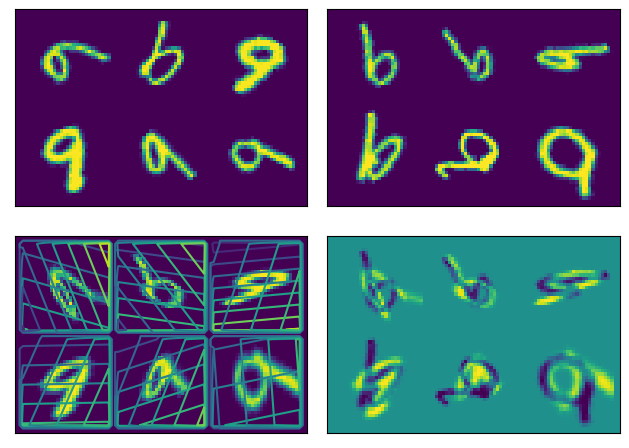

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.29s/it]


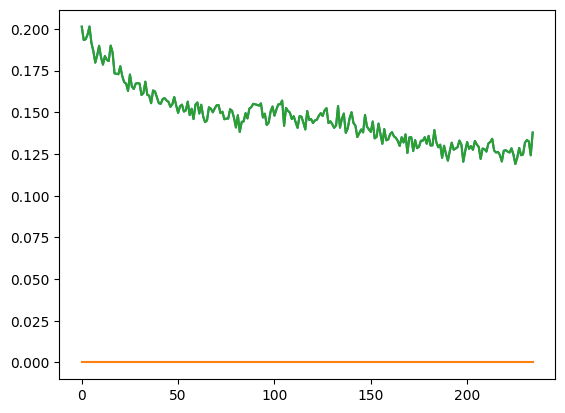

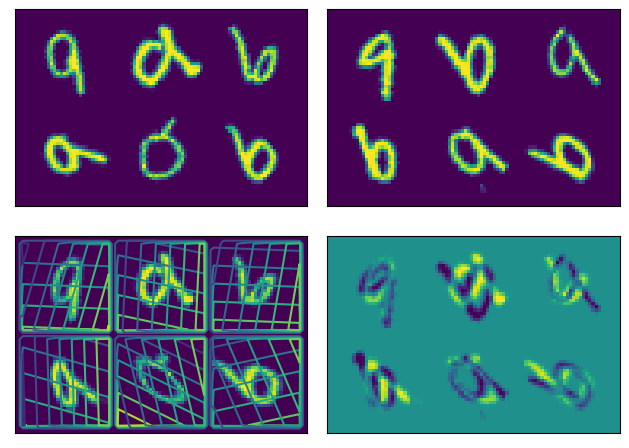

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.31s/it]


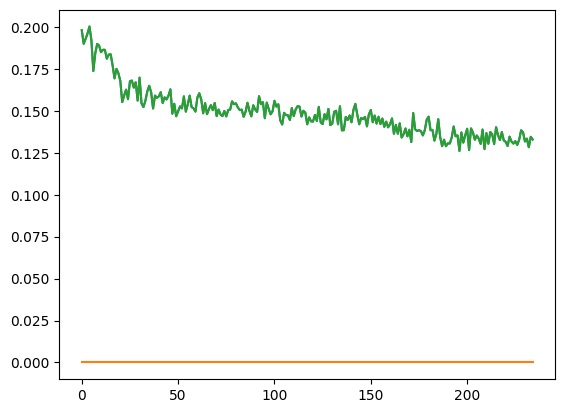

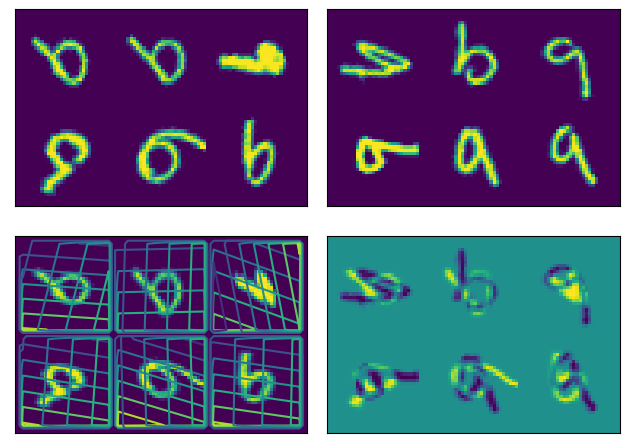

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:19<00:00,  3.83s/it]


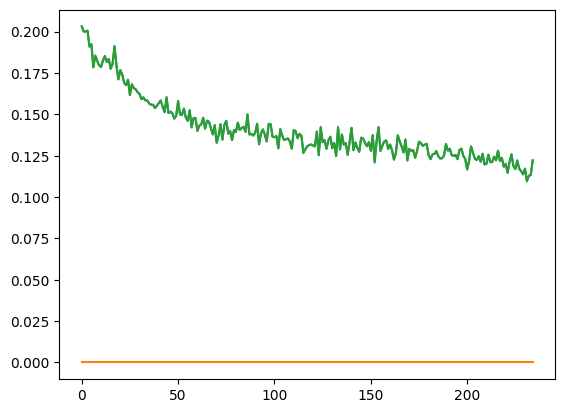

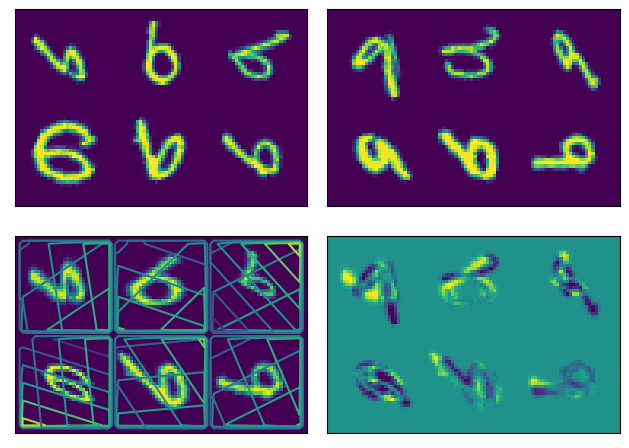

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:19<00:00,  3.86s/it]


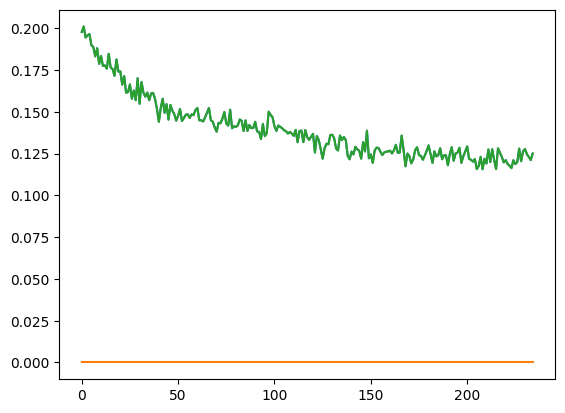

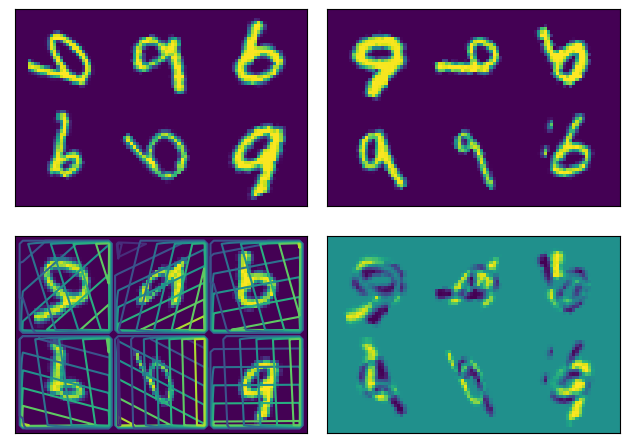

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:19<00:00,  3.81s/it]


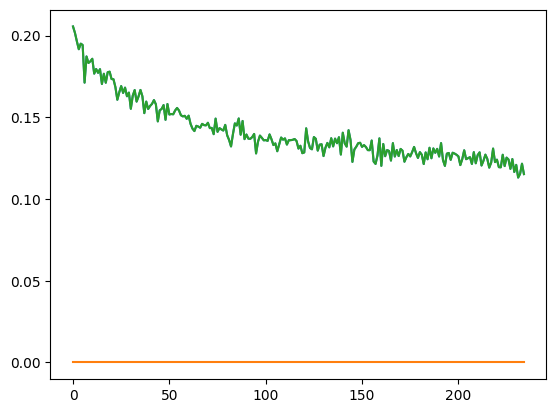

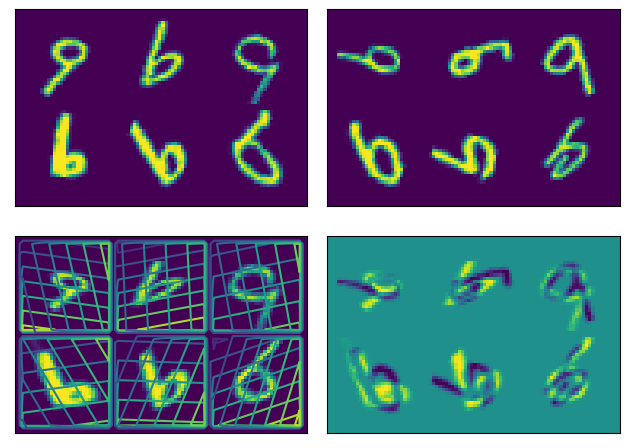

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:18<00:00,  3.76s/it]


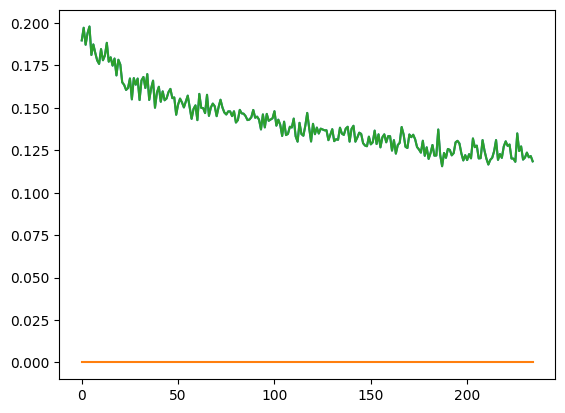

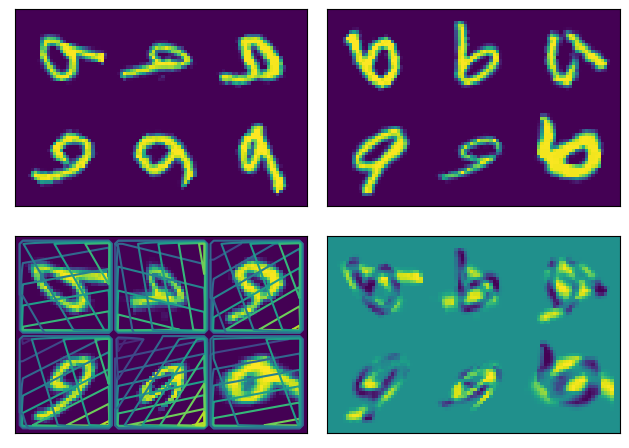

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:22<00:00,  4.56s/it]


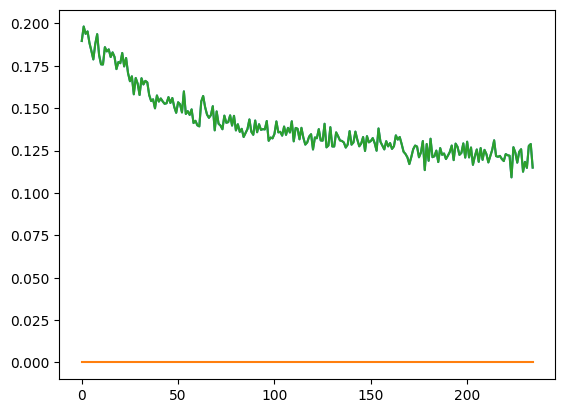

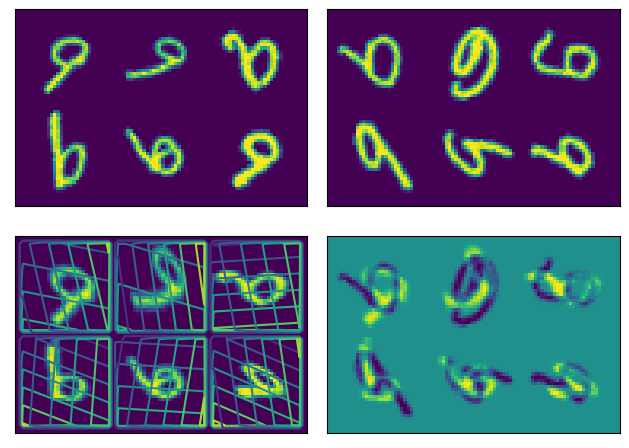

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:23<00:00,  4.79s/it]


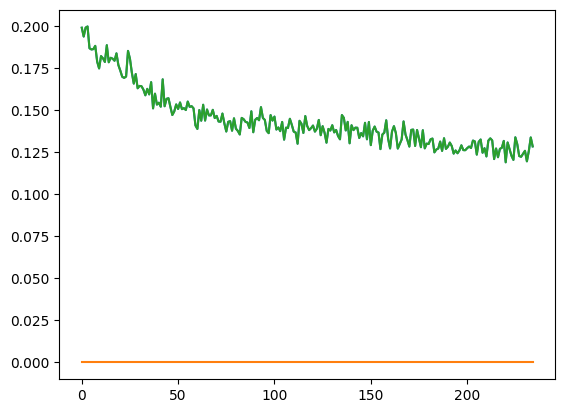

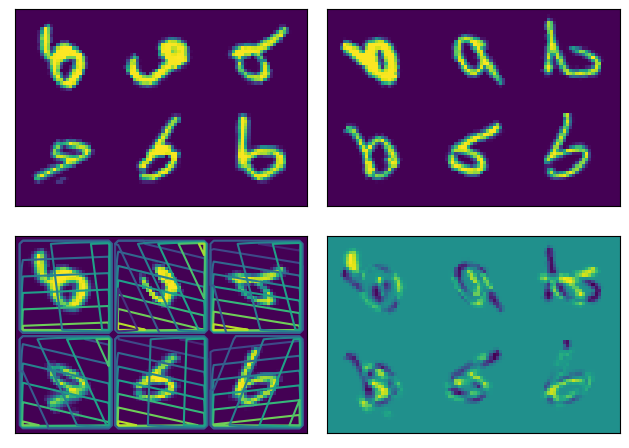

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:22<00:00,  4.55s/it]


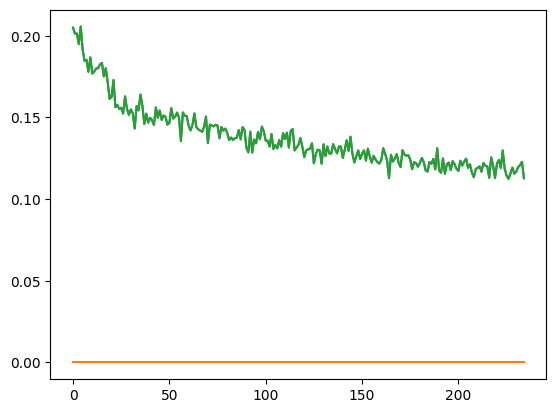

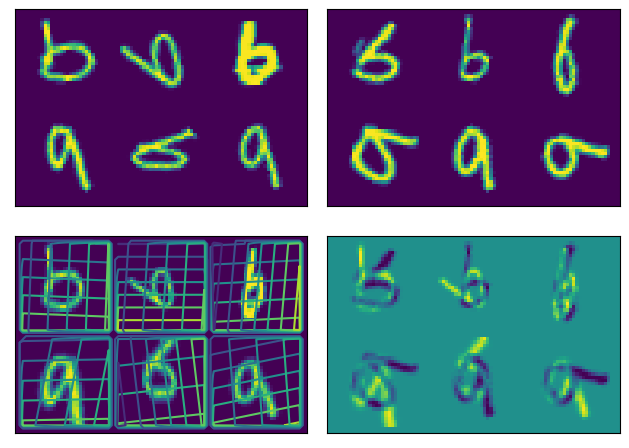

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:24<00:00,  4.81s/it]


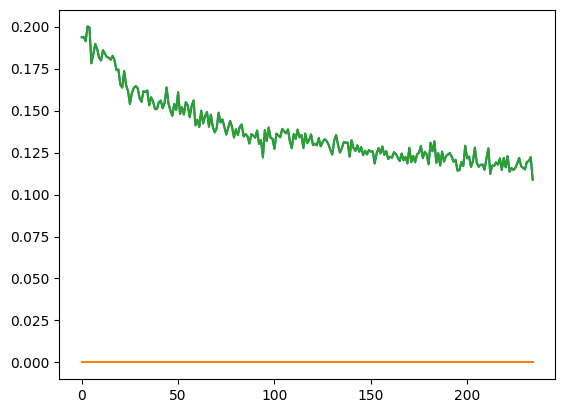

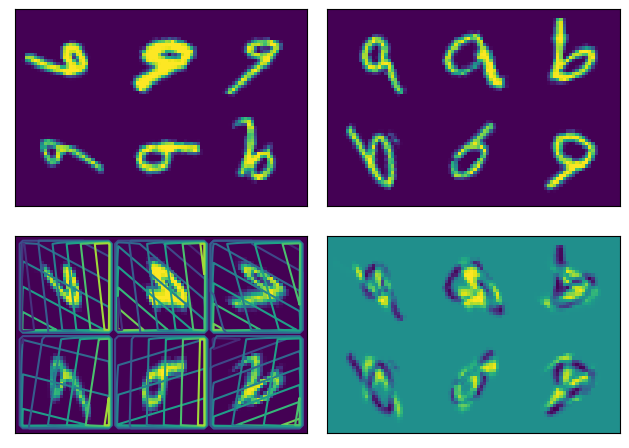

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:26<00:00,  5.34s/it]


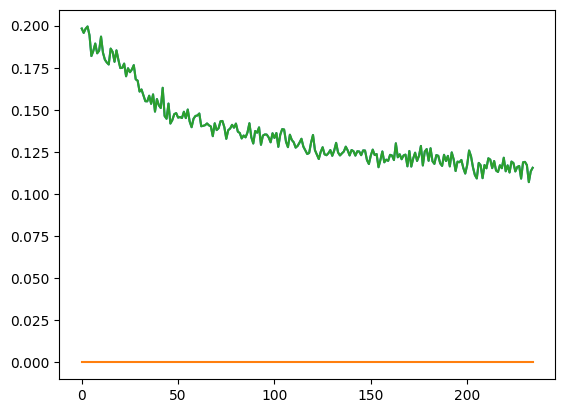

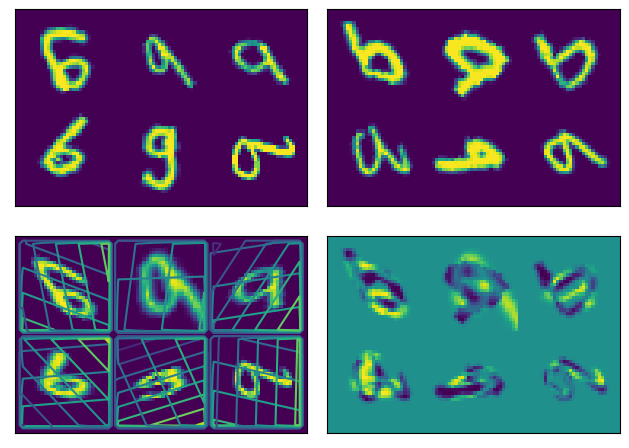

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:26<00:00,  5.37s/it]


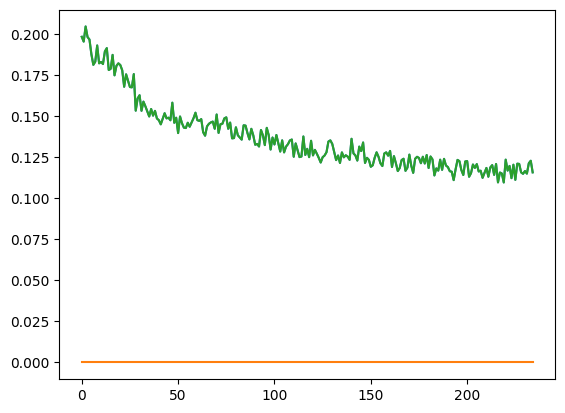

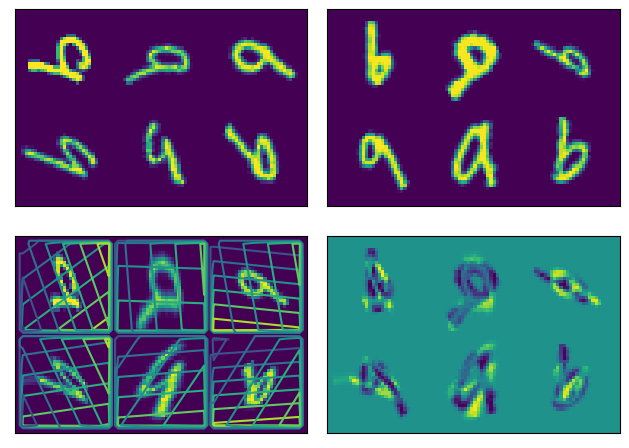

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:25<00:00,  5.19s/it]


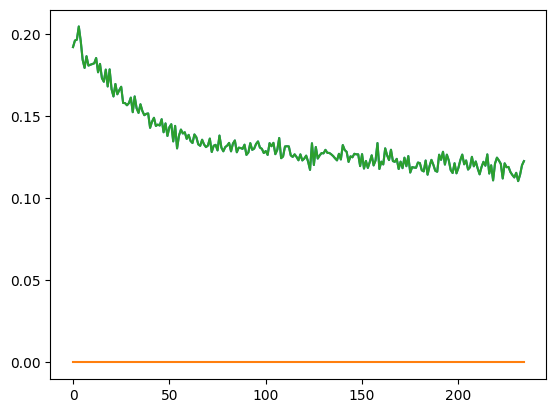

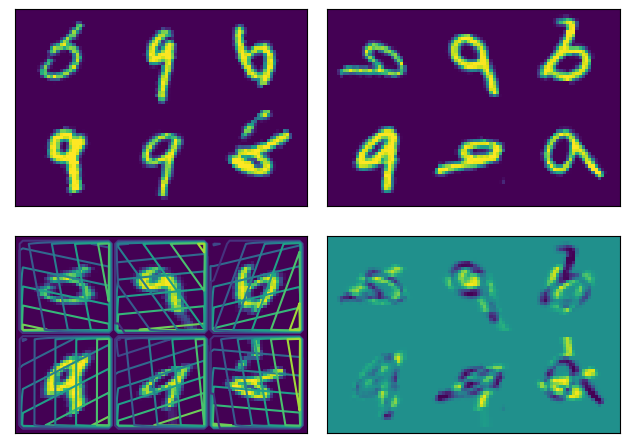

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:26<00:00,  5.33s/it]


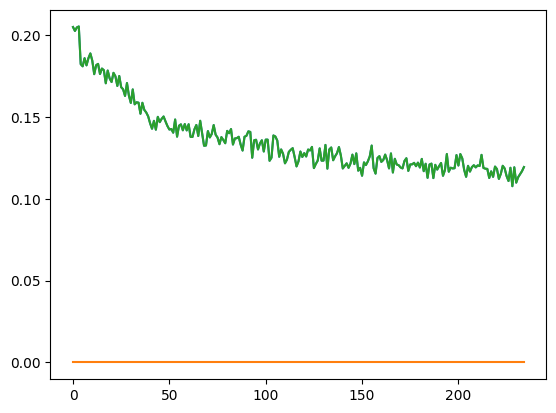

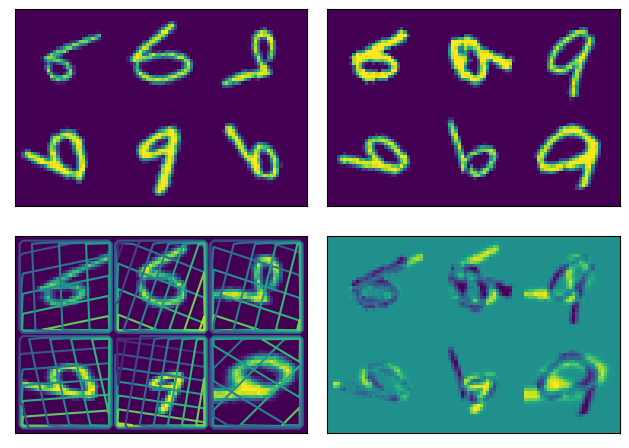

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  5.91s/it]


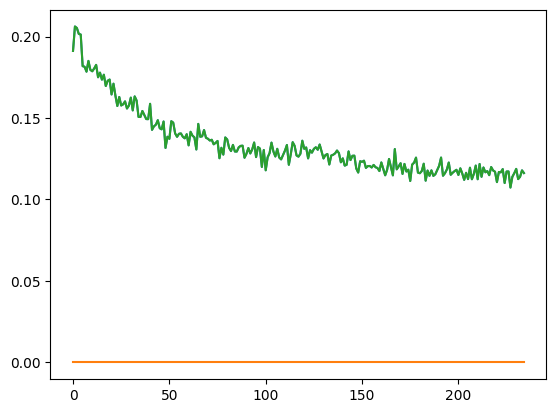

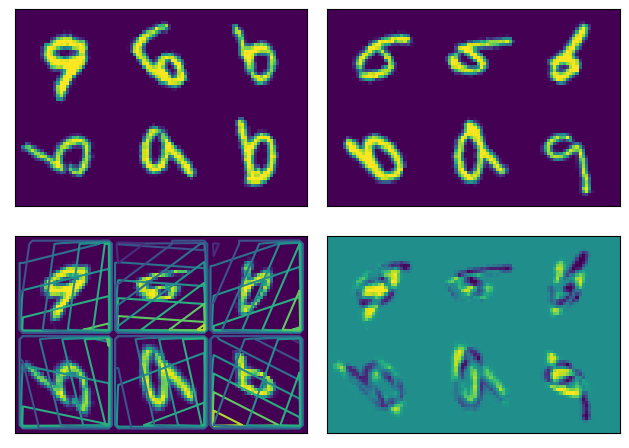

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.10s/it]


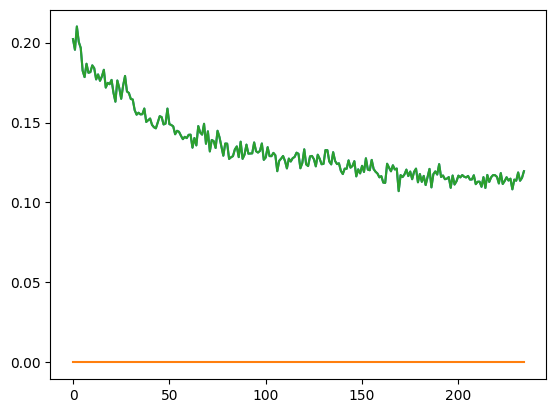

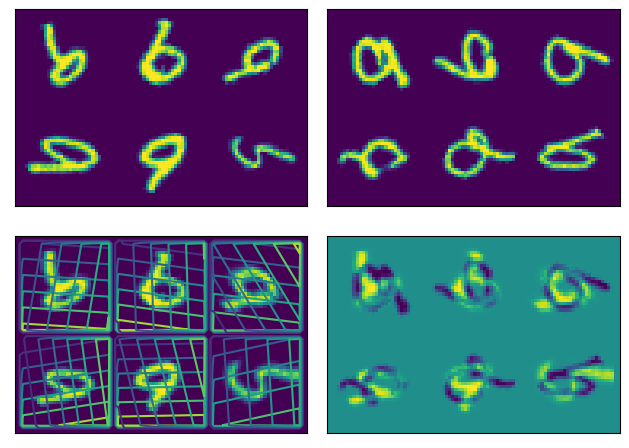

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  5.99s/it]


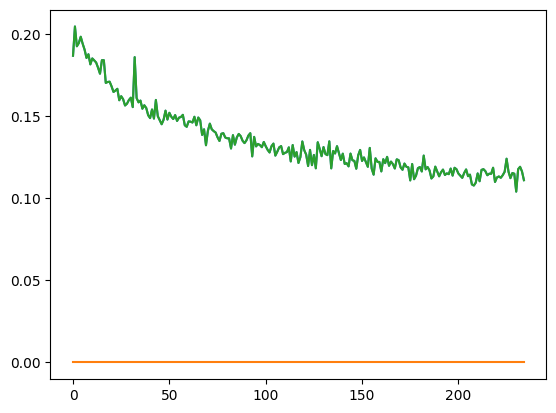

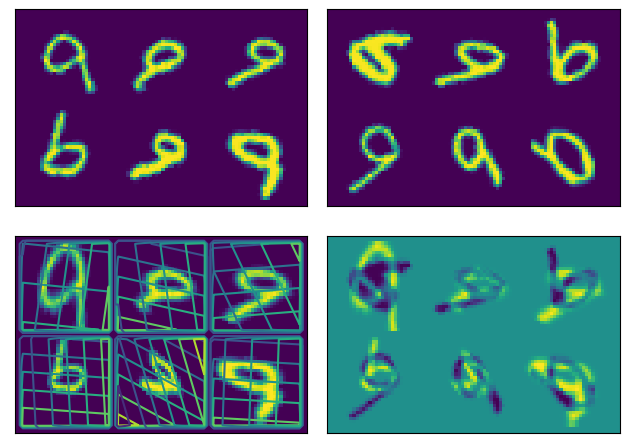

In [96]:
steps_arr_ssd = []
goodness_arr_ssd = []

for n_steps in range(10):
    for samples in range(4):
        regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

        inner_net = regnet

        for _ in range(n_steps):
             regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))
             inner_net = icon.TwoStepRegistration(
                 inner_net,
                 regnet
             )

        net = icon.losses.BendingEnergyNet(inner_net, icon.ssd, lmbda=.1)

        goodness = performance(net, 5)
        
        steps_arr_ssd.append(n_steps)
        goodness_arr_ssd.append(goodness)

In [99]:
steps_arr_aug = []
goodness_arr_aug = []

for n_steps in range(6, 7):
    for samples in range(4):
        regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))

        inner_net = regnet

        for _ in range(n_steps):
             regnet = constr.FirstTransform(constr.ConsistentFromMatrix(networks.ConvolutionalMatrixNet(dimension=2)))
             inner_net = icon.TwoStepRegistration(
                 inner_net,
                 regnet
             )

        net = icon.losses.BendingEnergyNet(inner_net, icon.LNCC(sigma=4), lmbda=.1)

        goodness = performance(net, 5)
        
        steps_arr_aug.append(n_steps)
        goodness_arr_aug.append(goodness)

In [216]:
ls results

ls: cannot access 'results': No such file or directory


In [220]:
import footsteps
torch.save(regnet.state_dict(), footsteps.output_dir + "good_9_aligner")


Input name of experiment:


 9 aligner


Saving results to results/9 aligner/
